# Kepler Exobolygók azonosítása Machine Learning segítségével

In [1]:
# import image module 
from IPython.display import Image 
  
# get the image 
Image(url="pic/PIA18904~large.jpg", width=300, height=300) 

A Kepler űrteleszkópot 2009-ben indította a NASA, az első olyan misszióként, amely földszerű exobolygók felfedezésére irányult a lakható zónákban. Több mint 150 000 csillag fényességét figyelte meg, és több mint 2600 megerősített bolygót azonosított. 2013-ban a küldetést kiterjesztették K2 néven, új égboltterületek megfigyelésére. A Kepler forradalmasította a bolygókutatást, megmutatva, hogy több bolygó van a galaxisunkban, mint csillag. A misszió 2018-ban véget ért, de hatalmas örökséget hagyott maga után a kutatás számára.

- Indulás Dátuma: 2009. március 7.
- Küldetés Időtartama: Kezdetben 3,5 év, majd meghosszabbítva 2018. október 30-ig
- Elsődleges Küldetés: 4 év
- Másodlagos Küldetés: 5,5 év
- Megfigyelt Csillagok Száma: Több mint 150 000
- Felfedezett Bolygók Száma: Több mint 2 600 megerősített exobolygó
- Kepler Nézőpontja: 105 négyzetfok
- Fotométer Érzékenység: Képes észlelni a fényesség változását akár 20 ppm (egymillióból 20)
- Gyűjtött Adatok Mennyisége: Több mint 50 terabájt
- Felfedezett Bolygórendszerek Száma: Több mint 1 000

ADATKÉSZLET: Kepler Objects of Interest (KOI) táblázat a Kepler-misszió által azonosított bolygójelöltekről nyújt adatokat. Tartalmazza a jelöltek státuszát, pályaparamétereket, csillagtulajdonságokat és fotometriai adatokat. Ezek az információk segítenek az exobolygók azonosításában és megerősítésében. A részletesebb adatoszlopok a jelöltek besorolását és tulajdonságaik leírását szolgálják.

https://exoplanetarchive.ipac.caltech.edu/cgi-bin/TblView/nph-tblView?app=ExoTbls&config=cumulative

## 1. Könyvtárak és adatkészlet betöltése

In [2]:
import os
import sys
import json
import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt

print(f"Python version: {sys.version}")
print(f"Pandas version: {pd.__version__}")
print(f"Numpy version: {np.__version__}")
print(f"Matplotlib version: {matplotlib.__version__}")

Python version: 3.10.12 (main, Sep 11 2024, 15:47:36) [GCC 11.4.0]
Pandas version: 2.2.2
Numpy version: 1.24.3
Matplotlib version: 3.5.1


In [3]:
exo_column_names = pd.read_csv(r"data/cumulative_2024.09.03_11.45.57.csv", on_bad_lines="skip")
exo_data_clean = pd.read_csv(r"data/cumulative_2024.09.03_11.45.57.csv", skiprows=143, low_memory=False, header=0)

In [4]:
exo_column_names.head()

,# This file was produced by the NASA Exoplanet Archive http://exoplanetarchive.ipac.caltech.edu
0,# Tue Sep 3 11:45:57 2024
1,#
2,# COLUMN kepid: KepID
3,# COLUMN kepoi_name: KOI Name
4,# COLUMN kepler_name: Kepler Name


In [5]:
exo_data_clean.head()

,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,#
rowid,kepid,kepoi_name,kepler_name,koi_disposition,koi_vet_stat,koi_vet_date,koi_pdisposition,koi_score,koi_fpflag_nt,koi_fpflag_ss,koi_fpflag_co,koi_fpflag_ec,koi_disp_prov,koi_comment,koi_period,koi_period_err1,koi_period_err2,koi_time0bk,koi_time0bk_err1,koi_time0bk_err2,koi_time0,koi_time0_err1,koi_time0_err2,koi_eccen,koi_eccen_err1,koi_eccen_err2,koi_longp,koi_longp_err1,koi_longp_err2,koi_impact,koi_impact_err1,koi_impact_err2,koi_duration,koi_duration_err1,koi_duration_err2,koi_ingress,koi_ingress_err1,koi_ingress_err2,koi_depth,koi_depth_err1,koi_depth_err2,koi_ror,koi_ror_err1,koi_ror_err2,koi_srho,koi_srho_err1,koi_srho_err2,koi_fittype,koi_prad,koi_prad_err1,koi_prad_err2,koi_sma,koi_sma_err1,koi_sma_err2,koi_incl,koi_incl_err1,koi_incl_err2,koi_teq,koi_teq_err1,koi_teq_err2,koi_insol,koi_insol_err1,koi_insol_err2,koi_dor,koi_dor_err1,koi_dor_err2,koi_limbdark_mod,koi_ldm_coeff4,koi_ldm_coeff3,koi_ldm_coeff2,koi_ldm_coeff1,koi_parm_prov,koi_max_sngle_ev,koi_max_mult_ev,koi_model_snr,koi_count,koi_num_transits,koi_tce_plnt_num,koi_tce_delivname,koi_quarters,koi_bin_oedp_sig,koi_trans_mod,koi_model_dof,koi_model_chisq,koi_datalink_dvr,koi_datalink_dvs,koi_steff,koi_steff_err1,koi_steff_err2,koi_slogg,koi_slogg_err1,koi_slogg_err2,koi_smet,koi_smet_err1,koi_smet_err2,koi_srad,koi_srad_err1,koi_srad_err2,koi_smass,koi_smass_err1,koi_smass_err2,koi_sage,koi_sage_err1,koi_sage_err2,koi_sparprov,ra,dec,koi_kepmag,koi_gmag,koi_rmag,koi_imag,koi_zmag,koi_jmag,koi_hmag,koi_kmag,koi_fwm_stat_sig,koi_fwm_sra,koi_fwm_sra_err,koi_fwm_sdec,koi_fwm_sdec_err,koi_fwm_srao,koi_fwm_srao_err,koi_fwm_sdeco,koi_fwm_sdeco_err,koi_fwm_prao,koi_fwm_prao_err,koi_fwm_pdeco,koi_fwm_pdeco_err,koi_dicco_mra,koi_dicco_mra_err,koi_dicco_mdec,koi_dicco_mdec_err,koi_dicco_msky,koi_dicco_msky_err,koi_dikco_mra,koi_dikco_mra_err,koi_dikco_mdec,koi_dikco_mdec_err,koi_dikco_msky,koi_dikco_msky_err
1,10797460,K00752.01,Kepler-227 b,CONFIRMED,Done,2018-08-16,CANDIDATE,1.0000,0,0,0,0,q1_q17_dr25_sup_koi,NO_COMMENT,9.488035570,2.7750000e-05,-2.7750000e-05,170.5387500,2.160000e-03,-2.160000e-03,2455003.539,2.160000e-03,-2.160000e-03,0,NaN,NaN,NaN,NaN,NaN,0.1460,0.3180,-0.1460,2.95750,0.08190,-0.08190,NaN,NaN,NaN,6.1580e+02,1.950e+01,-1.950e+01,0.022344,8.320000e-04,-5.280000e-04,3.20796,0.33173,-1.09986,LS+MCMC,2.26,2.600e-01,-1.500e-01,0.0853,NaN,NaN,89.66,NaN,NaN,793.0,NaN,NaN,93.59,29.45,-16.65,24.810000,2.600000,-2.600000,Claret (2011 A&A 529 75) ATLAS LS,0.0000,0.0000,0.2291,0.4603,q1_q17_dr25_koi,5.1358490,28.4708200,35.80,2,142,1,q1_q17_dr25_tce,11111111111111111000000000000000,0.68640,Mandel and Agol (2002 ApJ 580 171),NaN,NaN,010/010797/010797460/dv/kplr010797460-20160209194854_dvr.pdf,010/010797/010797460/dv/kplr010797460-001-20160209194854_dvs.pdf,5455.00,81.00,-81.00,4.467,0.064,-0.096,0.1400,0.1500,-0.1500,0.9270,0.1050,-0.0610,0.9190,0.0520,-0.0460,NaN,NaN,NaN,q1_q17_dr25_stellar,291.934230,48.141651,15.347,15.890,15.270,15.114,15.006,14.082,13.751,13.648,0.002,19.462294000,0.000014000,48.14191000,0.00013000,0.43000,0.51000,0.94000,0.48000,-2.000000e-04,3.20000e-04,-5.500000e-04,3.10000e-04,-0.0100,0.1300,0.2000,0.1600,0.2000,0.1700,0.0800,0.1300,0.3100,0.1700,0.3200,0.1600
2,10797460,K00752.02,Kepler-227 c,CONFIRMED,Done,2018-08-16,CANDIDATE,0.9690,0,0,0,0,q1_q17_dr25_sup_koi,NO_COMMENT,54.418382700,2.4790000e-04,-2.4790000e-04,162.5138400,3.520000e-03,-3.520000e-03,2454995.514,3.520000e-03,-3.520000e-03,0,NaN,NaN,NaN,NaN,NaN,0.5860,0.0590,-0.4430,4.50700,0.11600,-0.11600,NaN,NaN,NaN,8.7480e+02,3.550e+01,-3.550e+01,0.027954,9.078000e-03,-1.347000e-03,3.02368,2.20489,-2.49638,LS+MCMC,2.83,3.200e-01,-1.900e-01,0.2734,NaN,NaN,89.57,NaN,NaN,443.0,NaN,NaN,9.11,2.87,-1.62,77.900000,28.400000,-28.400000,Claret (2011 A&A 529 75) ATLAS LS,0.0000,0.0000,0.2291,0.4603,q1_q17_dr25_koi,7.0276690,20.1095070,25.80,2,25

In [6]:
exo_data_clean.to_csv(r"data/cumulative_2024.09.03_clean.csv")

In [7]:
print('Setup is completed')

Setup is completed


## 2. Adatkészlet előfeldolgozása

In [8]:
exo_column_names.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 143 entries, 0 to 142
Data columns (total 1 columns):
 #   Column                                                                                            Non-Null Count  Dtype 
---  ------                                                                                            --------------  ----- 
 0   # This file was produced by the NASA Exoplanet Archive  http://exoplanetarchive.ipac.caltech.edu  143 non-null    object
dtypes: object(1)
memory usage: 1.2+ KB


In [9]:
exo_column_names = exo_column_names.iloc[:-1,:]
exo_column_names = exo_column_names.iloc[2:,:]

In [10]:
exo_column_names.head()

,# This file was produced by the NASA Exoplanet Archive http://exoplanetarchive.ipac.caltech.edu
2,# COLUMN kepid: KepID
3,# COLUMN kepoi_name: KOI Name
4,# COLUMN kepler_name: Kepler Name
5,# COLUMN koi_disposition: Exoplanet Archive Di...
6,# COLUMN koi_vet_stat: Vetting Status


In [11]:
column_names = dict()
for index, row in exo_column_names.iterrows():
    temp = row.values[0][9:].split(": ")
    column_names[temp[0].lstrip()] = temp[1].lstrip().replace(' ', '_').replace('[', '').replace(']', '').replace('.', '')
    print(f"{temp[0].lstrip()}:{(25 - len(temp[0].lstrip())) * ' '}{temp[1].lstrip().replace(' ', '_').replace('[', '').replace(']', '').replace('.', '')}")

kepid:                    KepID
kepoi_name:               KOI_Name
kepler_name:              Kepler_Name
koi_disposition:          Exoplanet_Archive_Disposition
koi_vet_stat:             Vetting_Status
koi_vet_date:             Date_of_Last_Parameter_Update
koi_pdisposition:         Disposition_Using_Kepler_Data
koi_score:                Disposition_Score
koi_fpflag_nt:            Not_Transit-Like_False_Positive_Flag
koi_fpflag_ss:            Stellar_Eclipse_False_Positive_Flag
koi_fpflag_co:            Centroid_Offset_False_Positive_Flag
koi_fpflag_ec:            Ephemeris_Match_Indicates_Contamination_False_Positive_Flag
koi_disp_prov:            Disposition_Provenance
koi_comment:              Comment
koi_period:               Orbital_Period_days
koi_period_err1:          Orbital_Period_Upper_Unc_days
koi_period_err2:          Orbital_Period_Lower_Unc_days
koi_time0bk:              Transit_Epoch_BKJD
koi_time0bk_err1:         Transit_Epoch_Upper_Unc_BKJD
koi_time0bk_err2:         Tr

In [12]:
# Convert and write JSON object to file
with open("json/columns_names.json", "w") as outfile: 
    json.dump(column_names, outfile)

In [14]:
with open("json/data_types.json", "r") as file:
    data_types = json.load(file)

In [15]:
exo_data = pd.read_csv(r"data/cumulative_2024.09.03_clean.csv", low_memory=False, skip_blank_lines=True, header=1, dtype=data_types)

In [16]:
exo_data.shape

(9564, 141)

In [17]:
exo_data.head()

,rowid,kepid,kepoi_name,kepler_name,koi_disposition,koi_vet_stat,koi_vet_date,koi_pdisposition,koi_score,koi_fpflag_nt,...,koi_dicco_mdec,koi_dicco_mdec_err,koi_dicco_msky,koi_dicco_msky_err,koi_dikco_mra,koi_dikco_mra_err,koi_dikco_mdec,koi_dikco_mdec_err,koi_dikco_msky,koi_dikco_msky_err
0,1,10797460,K00752.01,Kepler-227 b,CONFIRMED,Done,2018-08-16,CANDIDATE,1.000,0,...,0.200,0.160,0.200,0.170,0.080,0.130,0.310,0.170,0.320,0.160
1,2,10797460,K00752.02,Kepler-227 c,CONFIRMED,Done,2018-08-16,CANDIDATE,0.969,0,...,0.000,0.480,0.390,0.360,0.490,0.340,0.120,0.730,0.500,0.450
2,3,10811496,K00753.01,NaN,CANDIDATE,Done,2018-08-16,CANDIDATE,0.000,0,...,-0.034,0.070,0.042,0.072,0.002,0.071,-0.027,0.074,0.027,0.074
3,4,10848459,K00754.01,NaN,FALSE POSITIVE,Done,2018-08-16,FALSE POSITIVE,0.000,0,...,0.147,0.078,0.289,0.079,-0.257,0.072,0.099,0.077,0.276,0.076
4,5,10854555,K00755.01,Kepler-664 b,CONFIRMED,Done,2018-08-16,CANDIDATE,1.000,0,...,-0.090,0.180,0.100,0.140,0.070,0.180,0.020,0.160,0.070,0.200


In [18]:
exo_data.describe()

,rowid,kepid,koi_score,koi_fpflag_nt,koi_fpflag_ss,koi_fpflag_co,koi_fpflag_ec,koi_period,koi_period_err1,koi_period_err2,...,koi_dicco_mdec,koi_dicco_mdec_err,koi_dicco_msky,koi_dicco_msky_err,koi_dikco_mra,koi_dikco_mra_err,koi_dikco_mdec,koi_dikco_mdec_err,koi_dikco_msky,koi_dikco_msky_err
count,9564.000000,9564.0,8054.000000,9564.0,9564.0,9564.0,9564.0,9564.000000,9110.000000,9110.000000,...,8965.000000,8965.000000,8965.000000,8965.000000,8994.000000,8994.000000,8994.000000,8994.000000,8994.000000,8994.000000
mean,4782.500000,7690628.327373,0.480829,0.208595,0.232748,0.197512,0.120033,75.671358,0.002148,-0.002148,...,-0.045420,0.446229,1.866561,0.489930,-0.024244,0.425337,-0.076749,0.436684,1.812566,0.476060
std,2761.033321,2653459.080974,0.476928,4.76729,0.422605,0.398142,0.325018,1334.744046,0.008236,0.008236,...,2.573558,0.569933,2.988742,0.646403,2.382286,0.602150,2.553758,0.567535,2.986376,0.647587
min,1.000000,757450.0,0.000000,0.0,0.0,0.0,0.0,0.241843,0.000000,-0.172500,...,-75.900000,0.067000,0.000000,0.067000,-27.800000,0.067000,-76.600000,0.067000,0.000000,0.067000
25%,2391.750000,5556034.25,0.000000,0.0,0.0,0.0,0.0,2.733684,0.000005,-0.000276,...,-0.387000,0.098000,0.170000,0.100000,-0.310000,0.087000,-0.390000,0.090000,0.210000,0.094000
50%,4782.500000,7906892.0,0.334000,0.0,0.0,0.0,0.0,9.752831,0.000035,-0.000035,...,0.000000,0.280000,0.610000,0.310000,-0.004000,0.250000,-0.017000,0.270000,0.583000,0.290000
75%,7173.250000,9873066.5,0.998000,0.0,0.0,0.0,0.0,40.715178,0.000276,-0.000005,...,0.300000,0.610000,2.160000,0.680000,0.290000,0.590000,0.300000,0.600000,1.970000,0.660000
max,9564.000000,12935144.0,1.000000,465.0,1.0,1.0,1.0,129995.778400,0.172500,0.000000,...,27.500000,22.000000,88.600000,32.000000,46.570000,33.000000,34.000000,22.000000,89.600000,32.000000


In [20]:
with open("json/columns_names.json", "r") as file:
    column_names = json.load(file)

In [21]:
exo_data = exo_data.rename(columns = column_names, inplace=False)

In [22]:
for column in exo_data.columns:
    if not exo_data[column].any():
        exo_data = exo_data.drop(column, axis=1)
        print(f"{column} is deleted because its empty")

Eccentricity is deleted because its empty
Eccentricity_Upper_Unc is deleted because its empty
Eccentricity_Lower_Unc is deleted because its empty
Long_of_Periastron_deg is deleted because its empty
Long_of_Periastron_Upper_Unc_deg is deleted because its empty
Long_of_Periastron_Lower_Unc_deg is deleted because its empty
Ingress_Duration_hrs is deleted because its empty
Ingress_Duration_Upper_Unc_hrs is deleted because its empty
Ingress_Duration_Lower_Unc_hrs is deleted because its empty
Orbit_Semi-Major_Axis_Upper_Unc_au is deleted because its empty
Orbit_Semi-Major_Axis_Lower_Unc_au is deleted because its empty
Inclination_Upper_Unc_deg is deleted because its empty
Inclination_Lower_Unc_deg is deleted because its empty
Equilibrium_Temperature_Upper_Unc_K is deleted because its empty
Equilibrium_Temperature_Lower_Unc_K is deleted because its empty
Limb_Darkening_Coeff_4 is deleted because its empty
Limb_Darkening_Coeff_3 is deleted because its empty
Degrees_of_Freedom is deleted becaus

In [23]:
clear_exo = exo_data.dropna()

In [24]:
print(f"Number of found planets: {clear_exo['Number_of_Planets'].sum()}")

Number of found planets: 4855


Text(0, 0.5, 'Bolygók száma egy rendszeren belül')

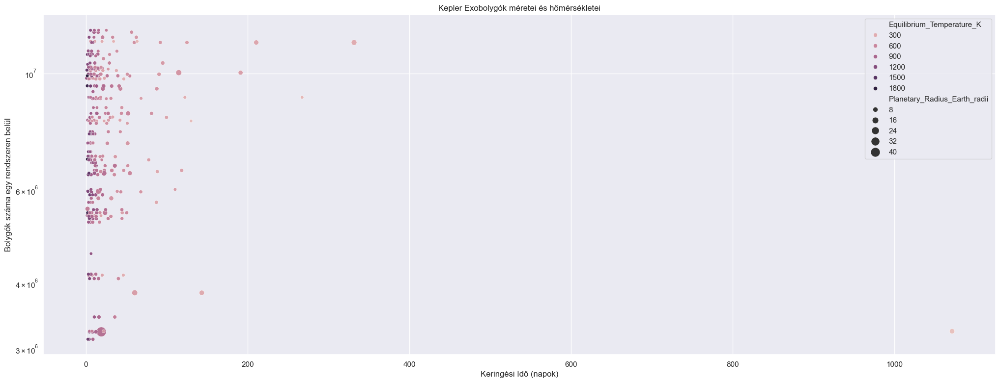

In [31]:
sns.set(rc = {'figure.figsize':(25,9)})
d1 = clear_exo[(clear_exo["Number_of_Planets"] >= 4)]
d2 = clear_exo.head(20)
op = sns.scatterplot(data=d1,
                     x="Orbital_Period_days",
                     y="KepID",
                     hue="Equilibrium_Temperature_K",
                     hue_norm=(0, 1800),
                     size="Planetary_Radius_Earth_radii",
                     legend="brief",
                     sizes=(20, 200))
op.set_yscale("log")

plt.title("Kepler Exobolygók méretei és hőmérsékletei")
plt.xlabel("Keringési Idő (napok)")
plt.ylabel("Bolygók száma egy rendszeren belül")

Text(0, 0.5, 'Bolygói Sugár (Föld sugár [rad])')

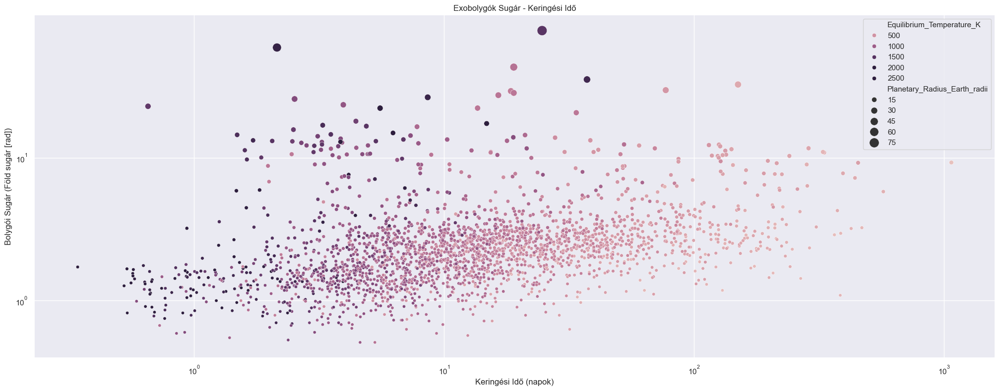

In [32]:
d3 = clear_exo
op = sns.scatterplot(data=d3,
                     x="Orbital_Period_days",
                     y="Planetary_Radius_Earth_radii",
                     hue="Equilibrium_Temperature_K",
                     hue_norm=(0, 1800),
                     size="Planetary_Radius_Earth_radii",
                     legend="brief",
                     sizes=(20, 200))

op.set_xscale("log")
op.set_yscale("log")

plt.title("Exobolygók Sugár - Keringési Idő")
plt.xlabel("Keringési Idő (napok)")
plt.ylabel("Bolygói Sugár (Föld sugár [rad])")

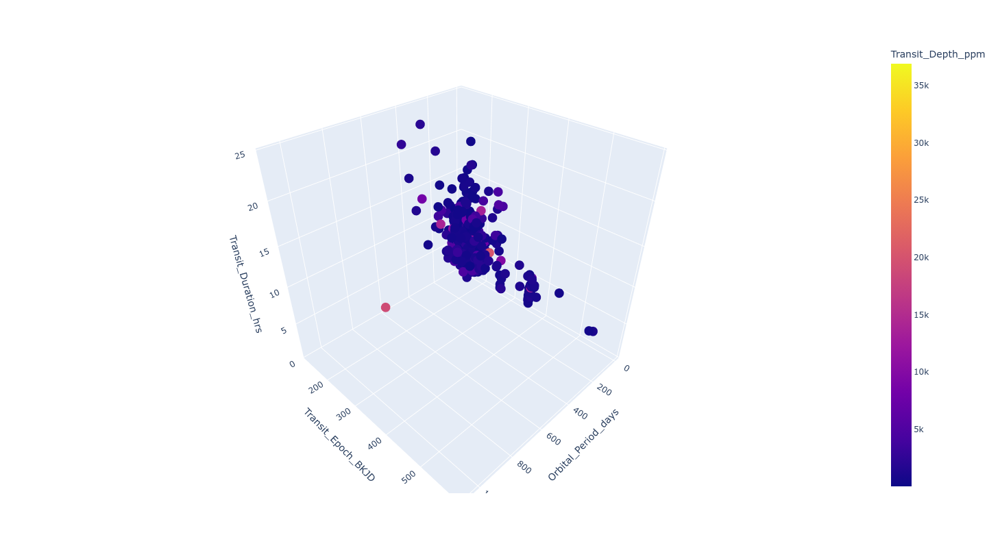

In [27]:
import plotly.express as px

fig = px.scatter_3d(clear_exo, x="Orbital_Period_days", y="Transit_Epoch_BKJD", z="Transit_Duration_hrs",
                    color="Transit_Depth_ppm", width=900, height=800)
fig.show()

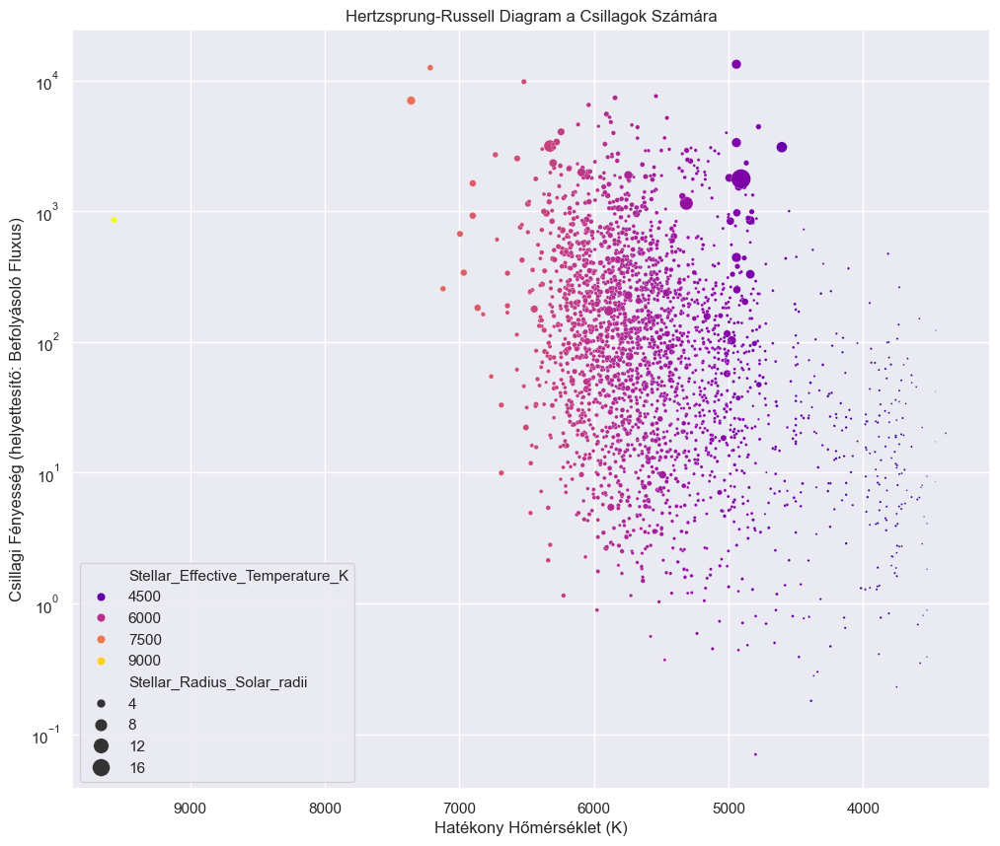

In [33]:
# Hertzsprung-Russell Diagram (HR Diagram) a Csillagok Számára

# Az HR diagram az asztrofizika alapköve, amely a csillagokat hőmérséklet és fényesség alapján osztályozza.
# Lehetővé teszi a csillagok osztályozásának (fő sorozat, óriások, fehér törpék stb.) és fejlődési szakaszaik megtekintését. 
# Az exobolygókat hordozó csillagok típusát azonosíthatjuk, megértve életstádiumaikat és hogy ezek hogyan befolyásolhatják a bolygókeletkezést.

import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12,10))
hr = sns.scatterplot(data=clear_exo,
                     x="Stellar_Effective_Temperature_K",
                     y="Insolation_Flux_Earth_flux",
                     hue="Stellar_Effective_Temperature_K",
                     size="Stellar_Radius_Solar_radii",
                     sizes=(0, 200),
                     palette="plasma",
                     legend="brief",
                     )
hr.set_yscale("log")
plt.gca().invert_xaxis()
plt.xlabel("Hatékony Hőmérséklet (K)")
plt.ylabel("Csillagi Fényesség (helyettesítő: Befolyásoló Fluxus)")
plt.title("Hertzsprung-Russell Diagram a Csillagok Számára")
plt.show()

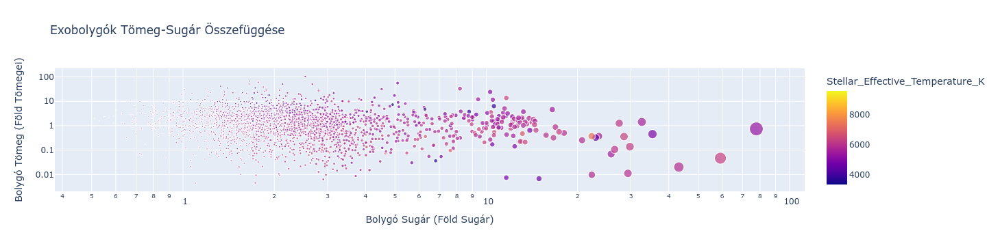

In [35]:
# Exobolygók Tömeg-Sugár Összefüggése

# Ez a diagram segít osztályozni a bolygókat kőzetbolygókként, gázbolygókként vagy valami köztes kategóriaként (pl. szuperföldek, mini-Neptunuszok, gázóriások).
# Lényeges a bolygók összetételének megértésében. 
# A különböző bolygók összehasonlítása ezen a diagramon feltárja a bolygóképződés és szerkezet közötti tendenciákat.

import plotly.express as px

fig = px.scatter(clear_exo,
                 x="Planetary_Radius_Earth_radii",
                 y="Fitted_Stellar_Density_g/cm**3",
                 color="Stellar_Effective_Temperature_K",
                 size="Planetary_Radius_Earth_radii",
                 log_x=True,
                 log_y=True, 
                 labels={"Planetary_Radius_Earth_radii": "Bolygó Sugár (Föld Sugár)", 
                         "Fitted_Stellar_Density_g/cm**3": "Becsült Csillagi Sűrűség (g/cm³)"}, 
                 title="Exobolygók Tömeg-Sugár Összefüggése")

fig.show()

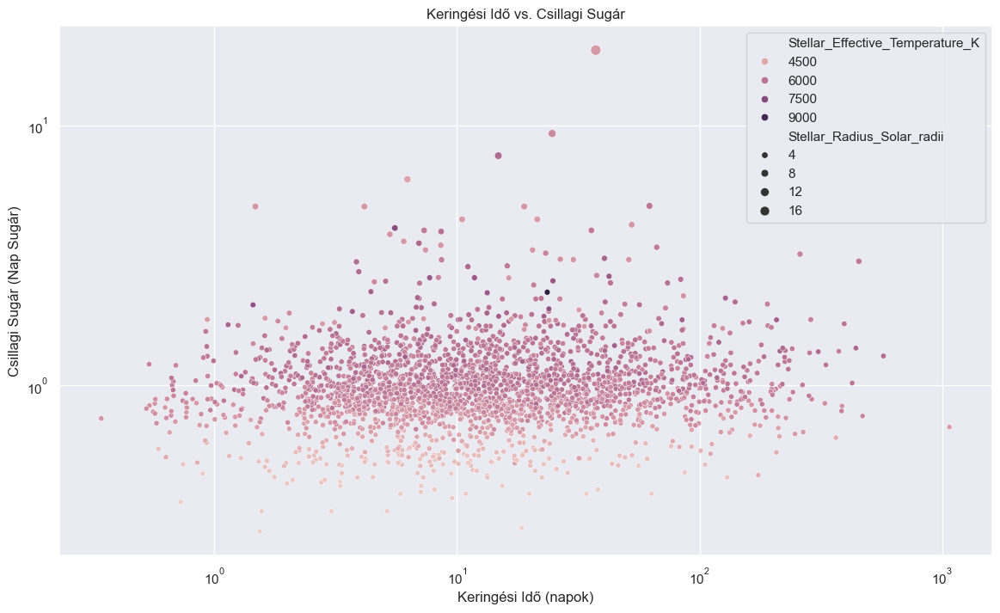

In [36]:
# Keringési Idő vs. Csillagi Sugár

# Ez a diagram megmutathatja, hogyan befolyásolja a csillagok mérete a bolygók keringési tulajdonságait. 
# A nagyobb csillagok hosszabb keringési idővel rendelkező bolygókat hordozhatnak, mivel nagyobb lakható zónákkal rendelkeznek. 
# Segít megérteni a bolygórendszerek felépítését a gazda csillagokkal való kapcsolatukban.

plt.figure(figsize=(14,8))
sns.scatterplot(data=clear_exo,
                x="Orbital_Period_days",
                y="Stellar_Radius_Solar_radii",
                size="Stellar_Radius_Solar_radii",
                hue="Stellar_Effective_Temperature_K",
                legend="brief",)

plt.xscale("log")
plt.yscale("log")
plt.xlabel("Keringési Idő (napok)")
plt.ylabel("Csillagi Sugár (Nap Sugár)")
plt.title("Keringési Idő vs. Csillagi Sugár")
plt.show()

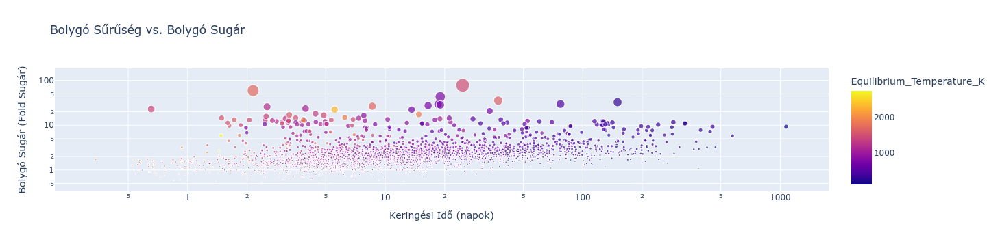

In [39]:
# Bolygó Sugár vs. Keringési Idő

# Ez a diagram segít megvizsgálni a bolygó mérete és a csillagjától való távolsága közötti kapcsolatot. 
# Különbséget tud tenni a gázóriások és a kis kőzetbolygók között, ami esetleg trendeket jelezhet a bolygóképződésben. 
# A nagyobb bolygók általában távolabb alakulnak ki a csillaguktól, míg a kisebb bolygók gyakran közelebb találhatók.

fig = px.scatter(clear_exo,
                 x='Orbital_Period_days',
                 y='Planetary_Radius_Earth_radii', 
                 color='Equilibrium_Temperature_K',
                 size='Planetary_Radius_Earth_radii',
                 log_x=True,
                 log_y=True, 
                 labels={'Orbital_Period_days': 'Keringési Idő (napok)', 
                         'Planetary_Radius_Earth_radii': 'Bolygó Sugár (Föld Sugár)'}, 
                 title='Bolygó Sűrűség vs. Bolygó Sugár')

fig.show()

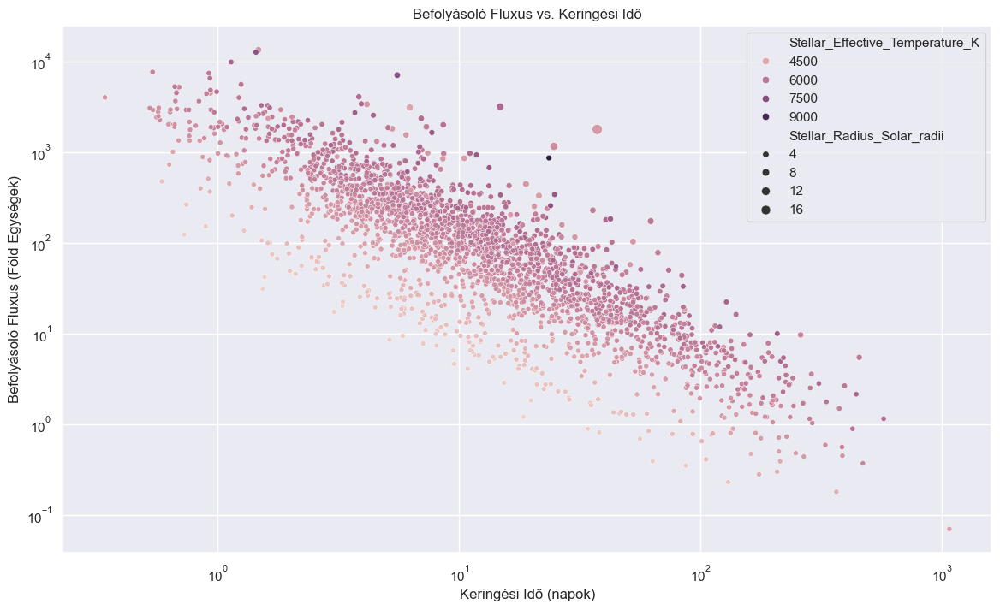

In [37]:
# Befolyásoló Fluxus vs. Keringési Idő

# z a diagram azt mutatja, hogyan csökken a csillagtól kapott energia (napfény) a bolygó távolságának növekedésével (hosszabb keringési idő). 
# Hasznos a potenciálisan lakható zónák tanulmányozásában és a bolygói éghajlatok megértésében. 
# A rövid keringési idővel rendelkező bolygók valószínűleg nagyon forrók, míg azok, amelyek hosszabb időtartamú keringéssel rendelkeznek, 
# kevesebb energiát kapnak, és hűvösebbek lehetnek.

plt.figure(figsize=(14,8))
sns.scatterplot(data=clear_exo,
                x='Orbital_Period_days',
                y='Insolation_Flux_Earth_flux',
                size='Stellar_Radius_Solar_radii',
                hue='Stellar_Effective_Temperature_K',
                legend='brief',)

plt.xscale('log')
plt.yscale('log')
plt.xlabel('Keringési Idő (napok)')
plt.ylabel('Befolyásoló Fluxus (Föld Egységek)')
plt.title('Befolyásoló Fluxus vs. Keringési Idő')
plt.show()

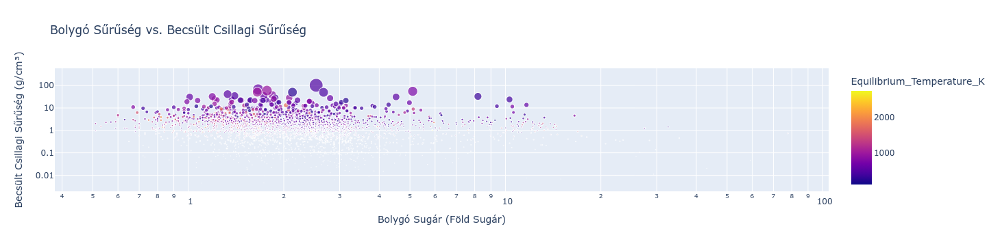

In [40]:
# Planetary Density vs. Planet Radius

# This chart helps to distinguish between different types of planets, such as gas giants, rocky planets, and water worlds.
# Rocky planets tend to be smaller but denser, while gas giants are larger but less dense.
# Planetary density is a key indicator of a planet's composition. You can classify planets based on density ranges.

fig = px.scatter(clear_exo,
                 x='Planetary_Radius_Earth_radii',
                 y='Fitted_Stellar_Density_g/cm**3',
                 color='Equilibrium_Temperature_K',
                 size='Fitted_Stellar_Density_g/cm**3',
                 log_x=True,
                 log_y=True, 
                 labels={'Planetary_Radius_Earth_radii': 'Bolygó Sugár (Föld Sugár)', 
                         'Fitted_Stellar_Density_g/cm**3': 'Becsült Csillagi Sűrűség (g/cm³)'}, 
                 title='Bolygó Sűrűség vs. Becsült Csillagi Sűrűség')
fig.show()

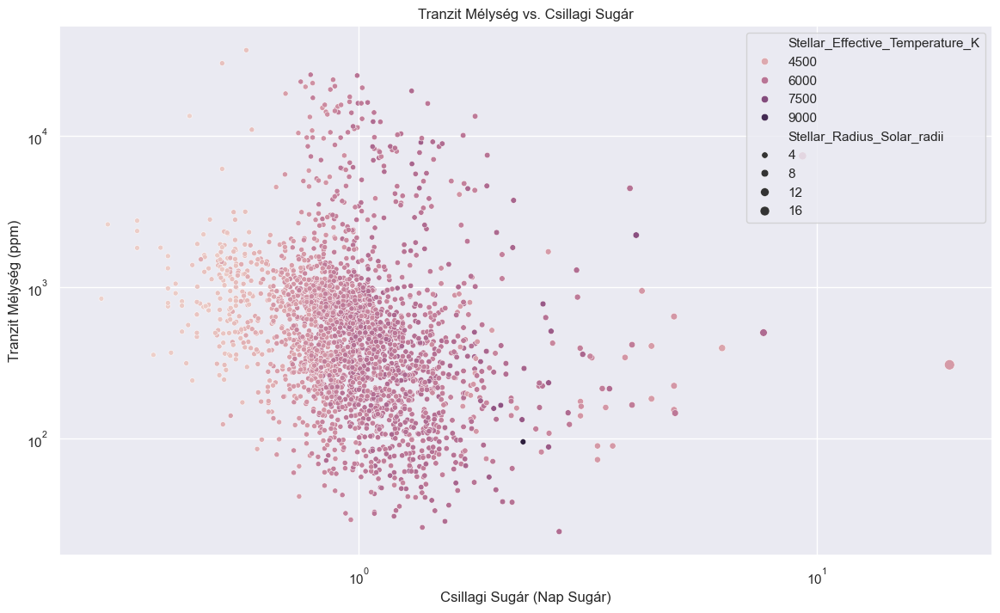

In [41]:
# Transit Mélység vs. Csillagi Sugár

# A tranzit mélysége közvetlenül kapcsolódik a bolygó méretéhez a csillaghoz viszonyítva. 
# Nagyobb csillagok esetén a tranzit mélysége általában sekélyebb egy adott méretű bolygó esetében. 
# Ez a diagram segít megérteni, hogyan befolyásolja a bolygó tranzit jeleinek méretét a gazda csillag mérete.

plt.figure(figsize=(14,8))
sns.scatterplot(data=clear_exo,
                x='Stellar_Radius_Solar_radii',
                y='Transit_Depth_ppm',
                size='Stellar_Radius_Solar_radii',
                hue='Stellar_Effective_Temperature_K',
                legend='brief'
               )

plt.xscale('log')
plt.yscale('log')
plt.xlabel('Csillagi Sugár (Nap Sugár)')
plt.ylabel('Tranzit Mélység (ppm)')
plt.title('Tranzit Mélység vs. Csillagi Sugár')
plt.show()

In [42]:
exo_data.head(10)

,rowid,KepID,KOI_Name,Kepler_Name,Exoplanet_Archive_Disposition,Vetting_Status,Date_of_Last_Parameter_Update,Disposition_Using_Kepler_Data,Disposition_Score,Not_Transit-Like_False_Positive_Flag,...,PRF_&Delta;&delta;<sub>SQ</sub>(OOT)_arcsec,PRF_&Delta;&delta;<sub>SQ</sub>(OOT)_Unc_arcsec,PRF_&Delta;&theta;<sub>SQ</sub>(OOT)_arcsec,PRF_&Delta;&theta;<sub>SQ</sub>(OOT)_Unc_arcsec,PRF_&Delta;&alpha;<sub>SQ</sub>(KIC)_arcsec,PRF_&Delta;&alpha;<sub>SQ</sub>(KIC)_Unc_arcsec,PRF_&Delta;&delta;<sub>SQ</sub>(KIC)_arcsec,PRF_&Delta;&delta;<sub>SQ</sub>(KIC)_Unc_arcsec,PRF_&Delta;&theta;<sub>SQ</sub>(KIC)_arcsec,PRF_&Delta;&theta;<sub>SQ</sub>(KIC)_Unc_arcsec
0,1,10797460,K00752.01,Kepler-227 b,CONFIRMED,Done,2018-08-16,CANDIDATE,1.000,0,...,0.200,0.160,0.200,0.170,0.080,0.130,0.310,0.170,0.320,0.160
1,2,10797460,K00752.02,Kepler-227 c,CONFIRMED,Done,2018-08-16,CANDIDATE,0.969,0,...,0.000,0.480,0.390,0.360,0.490,0.340,0.120,0.730,0.500,0.450
2,3,10811496,K00753.01,NaN,CANDIDATE,Done,2018-08-16,CANDIDATE,0.000,0,...,-0.034,0.070,0.042,0.072,0.002,0.071,-0.027,0.074,0.027,0.074
3,4,10848459,K00754.01,NaN,FALSE POSITIVE,Done,2018-08-16,FALSE POSITIVE,0.000,0,...,0.147,0.078,0.289,0.079,-0.257,0.072,0.099,0.077,0.276,0.076
4,5,10854555,K00755.01,Kepler-664 b,CONFIRMED,Done,2018-08-16,CANDIDATE,1.000,0,...,-0.090,0.180,0.100,0.140,0.070,0.180,0.020,0.160,0.070,0.200
5,6,10872983,K00756.01,Kepler-228 d,CONFIRMED,Done,2018-08-16,CANDIDATE,1.000,0,...,-0.070,0.110,0.080,0.130,-0.020,0.130,-0.080,0.100,0.080,0.100
6,7,10872983,K00756.02,Kepler-228 c,CONFIRMED,Done,2018-08-16,CANDIDATE,1.000,0,...,0.090,0.160,0.260,0.160,0.180,0.150,0.060,0.150,0.190,0.170
7,8,10872983,K00756.03,Kepler-228 b,CONFIRMED,Done,2018-08-16,CANDIDATE,0.992,0,...,-0.300,0.210,0.450,0.280,-0.410,0.330,-0.290,0.210,0.500,0.300
8,9,6721123,K00114.01,NaN,FALSE POSITIVE,Done,2018-08-16,FALSE POSITIVE,0.000,0,...,7.710,0.072,8.930,0.074,-4.537,0.071,7.713,0.074,8.948,0.077
9,10,10910878,K00757.01,Kepler-229 c,CONFIRMED,Done,2018-08-16,CANDIDATE,1.000,0,...,-0.015,0.073,0.044,0.075,0.005,0.075,0.030,0.082,0.031,0.081


In [43]:
for column in exo_data.columns:
    print(column)

rowid
KepID
KOI_Name
Kepler_Name
Exoplanet_Archive_Disposition
Vetting_Status
Date_of_Last_Parameter_Update
Disposition_Using_Kepler_Data
Disposition_Score
Not_Transit-Like_False_Positive_Flag
Stellar_Eclipse_False_Positive_Flag
Centroid_Offset_False_Positive_Flag
Ephemeris_Match_Indicates_Contamination_False_Positive_Flag
Disposition_Provenance
Comment
Orbital_Period_days
Orbital_Period_Upper_Unc_days
Orbital_Period_Lower_Unc_days
Transit_Epoch_BKJD
Transit_Epoch_Upper_Unc_BKJD
Transit_Epoch_Lower_Unc_BKJD
Transit_Epoch_BJD
Transit_Epoch_Upper_Unc_BJD
Transit_Epoch_Lower_Unc_BJD
Impact_Parameter
Impact_Parameter_Upper_Unc
Impact_Parameter_Lower_Unc
Transit_Duration_hrs
Transit_Duration_Upper_Unc_hrs
Transit_Duration_Lower_Unc_hrs
Transit_Depth_ppm
Transit_Depth_Upper_Unc_ppm
Transit_Depth_Lower_Unc_ppm
Planet-Star_Radius_Ratio
Planet-Star_Radius_Ratio_Upper_Unc
Planet-Star_Radius_Ratio_Lower_Unc
Fitted_Stellar_Density_g/cm**3
Fitted_Stellar_Density_Upper_Unc_g/cm**3
Fitted_Stellar_Den

In [44]:
drop_names = ["Vetting_Status",
              "rowid",
              "Date_of_Last_Parameter_Update",
              "Disposition_Using_Kepler_Data",
              "Disposition_Provenance", 
              "Link_to_DV_Report", 
              "Link_to_DV_Summary",  
              "KOI_Name",
              "Kepler_Name",
              "Disposition_Score"]

exo_data = exo_data.drop(drop_names, axis=1)

In [45]:
exo_data.head()

,KepID,Exoplanet_Archive_Disposition,Not_Transit-Like_False_Positive_Flag,Stellar_Eclipse_False_Positive_Flag,Centroid_Offset_False_Positive_Flag,Ephemeris_Match_Indicates_Contamination_False_Positive_Flag,Comment,Orbital_Period_days,Orbital_Period_Upper_Unc_days,Orbital_Period_Lower_Unc_days,...,PRF_&Delta;&delta;<sub>SQ</sub>(OOT)_arcsec,PRF_&Delta;&delta;<sub>SQ</sub>(OOT)_Unc_arcsec,PRF_&Delta;&theta;<sub>SQ</sub>(OOT)_arcsec,PRF_&Delta;&theta;<sub>SQ</sub>(OOT)_Unc_arcsec,PRF_&Delta;&alpha;<sub>SQ</sub>(KIC)_arcsec,PRF_&Delta;&alpha;<sub>SQ</sub>(KIC)_Unc_arcsec,PRF_&Delta;&delta;<sub>SQ</sub>(KIC)_arcsec,PRF_&Delta;&delta;<sub>SQ</sub>(KIC)_Unc_arcsec,PRF_&Delta;&theta;<sub>SQ</sub>(KIC)_arcsec,PRF_&Delta;&theta;<sub>SQ</sub>(KIC)_Unc_arcsec
0,10797460,CONFIRMED,0,0,0,0,NO_COMMENT,9.488036,2.775000e-05,-2.775000e-05,...,0.200,0.160,0.200,0.170,0.080,0.130,0.310,0.170,0.320,0.160
1,10797460,CONFIRMED,0,0,0,0,NO_COMMENT,54.418383,2.479000e-04,-2.479000e-04,...,0.000,0.480,0.390,0.360,0.490,0.340,0.120,0.730,0.500,0.450
2,10811496,CANDIDATE,0,0,0,0,DEEP_V_SHAPED,19.899140,1.494000e-05,-1.494000e-05,...,-0.034,0.070,0.042,0.072,0.002,0.071,-0.027,0.074,0.027,0.074
3,10848459,FALSE POSITIVE,0,1,0,0,MOD_ODDEVEN_DV---MOD_ODDEVEN_ALT---DEEP_V_SHAPED,1.736952,2.630000e-07,-2.630000e-07,...,0.147,0.078,0.289,0.079,-0.257,0.072,0.099,0.077,0.276,0.076
4,10854555,CONFIRMED,0,0,0,0,NO_COMMENT,2.525592,3.761000e-06,-3.761000e-06,...,-0.090,0.180,0.100,0.140,0.070,0.180,0.020,0.160,0.070,0.200


In [46]:
exo_data.to_csv(r"data/cumulative_2024.09.03_new.csv")

In [47]:
print(f"The dataframe have {exo_data.shape[0]} row and {exo_data.shape[1]} columns")

The dataframe have 9564 row and 109 columns


In [48]:
exo_data.isnull().sum()

KepID                                                0
Exoplanet_Archive_Disposition                        0
Not_Transit-Like_False_Positive_Flag                 0
Stellar_Eclipse_False_Positive_Flag                  0
Centroid_Offset_False_Positive_Flag                  0
                                                  ... 
PRF_&Delta;&alpha;<sub>SQ</sub>(KIC)_Unc_arcsec    570
PRF_&Delta;&delta;<sub>SQ</sub>(KIC)_arcsec        570
PRF_&Delta;&delta;<sub>SQ</sub>(KIC)_Unc_arcsec    570
PRF_&Delta;&theta;<sub>SQ</sub>(KIC)_arcsec        570
PRF_&Delta;&theta;<sub>SQ</sub>(KIC)_Unc_arcsec    570
Length: 109, dtype: int64

In [49]:
exo_data.info(113)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9564 entries, 0 to 9563
Data columns (total 109 columns):
 #    Column                                                       Dtype  
---   ------                                                       -----  
 0    KepID                                                        Int64  
 1    Exoplanet_Archive_Disposition                                object 
 2    Not_Transit-Like_False_Positive_Flag                         Int64  
 3    Stellar_Eclipse_False_Positive_Flag                          Int64  
 4    Centroid_Offset_False_Positive_Flag                          Int64  
 5    Ephemeris_Match_Indicates_Contamination_False_Positive_Flag  Int64  
 6    Comment                                                      object 
 7    Orbital_Period_days                                          float64
 8    Orbital_Period_Upper_Unc_days                                float64
 9    Orbital_Period_Lower_Unc_days                                

## 3. Adatok elemzése

In [50]:
print(exo_data.RA_decimal_degrees.isnull().sum())
print(exo_data.Dec_decimal_degrees.isnull().sum())

0
0


In [51]:
exo_data.Exoplanet_Archive_Disposition.value_counts()

Exoplanet_Archive_Disposition
FALSE POSITIVE    4839
CONFIRMED         2743
CANDIDATE         1982
Name: count, dtype: int64

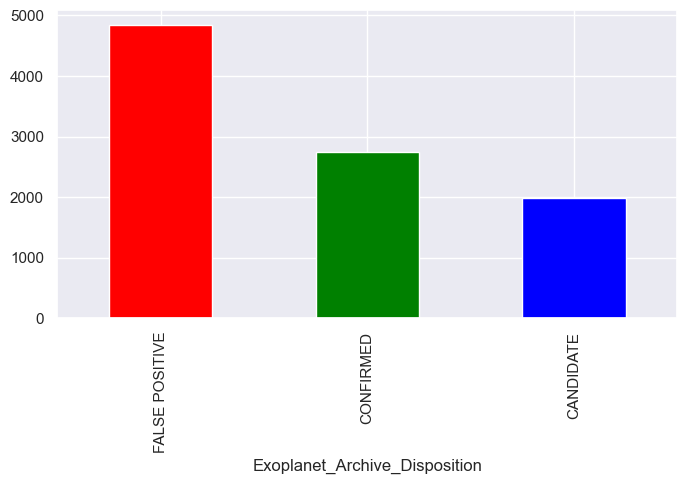

In [52]:
plt.figure(figsize=(8, 4))
exo_data.Exoplanet_Archive_Disposition.value_counts().plot(kind='bar', color=["red", "green", "blue"])
plt.show()

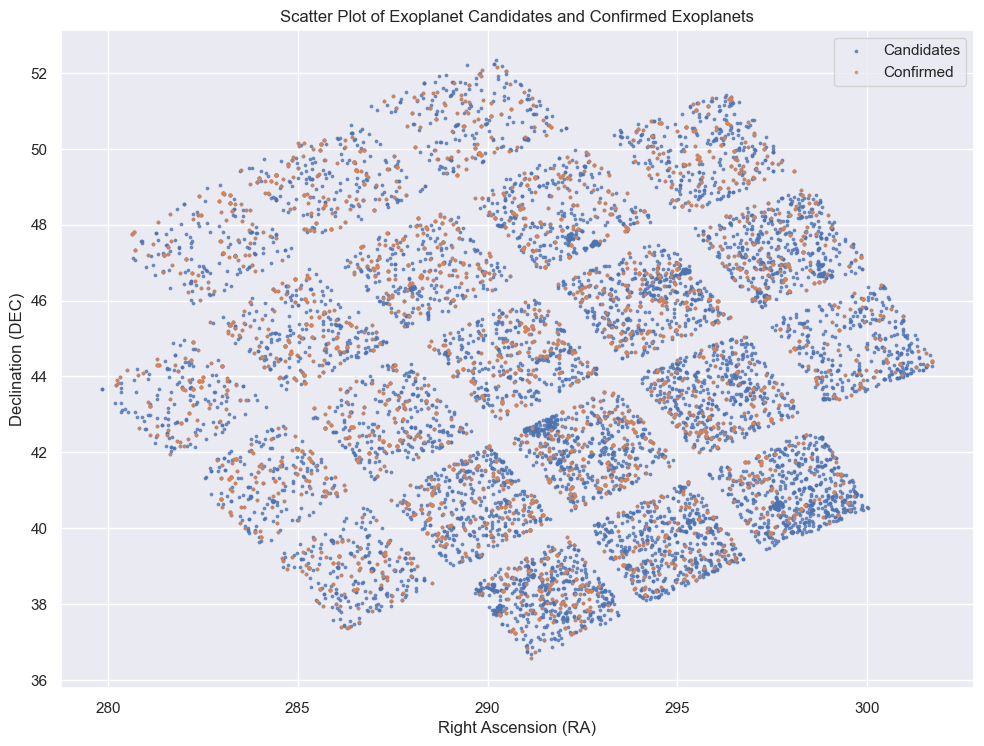

In [53]:
import matplotlib.pyplot as plt
%matplotlib inline

# Extract data
Candidates = exo_data[exo_data.Exoplanet_Archive_Disposition == "CANDIDATE"]
Confirmed = exo_data[exo_data.Exoplanet_Archive_Disposition == "CONFIRMED"]

# RA and DEC for Candidates and Confirmed
ra = exo_data.RA_decimal_degrees
dec = exo_data.Dec_decimal_degrees
ra_c = Confirmed.RA_decimal_degrees
dec_c = Confirmed.Dec_decimal_degrees

# Plot
fig, ax = plt.subplots(figsize=(10, 10))

ax.scatter(ra, dec, s=3, label="Candidates", alpha=0.7)
ax.scatter(ra_c, dec_c, s=3, label="Confirmed", alpha=0.7)

ax.set_xlabel("Right Ascension (RA)")
ax.set_ylabel("Declination (DEC)")
ax.set_title("Scatter Plot of Exoplanet Candidates and Confirmed Exoplanets")

ax.legend()
ax.set_aspect('equal', adjustable='box')
plt.tight_layout()

In [54]:
# Separiting the categorical features

categorical = exo_data.select_dtypes(include =[object])
print("Categorical Features in DataSet:",categorical.shape[1])
print(categorical.columns)

Categorical Features in DataSet: 9
Index(['Exoplanet_Archive_Disposition', 'Comment', 'Planetary_Fit_Type',
       'Limb_Darkening_Model', 'Parameters_Provenance', 'TCE_Delivery',
       'Quarters', 'Transit_Model', 'Stellar_Parameter_Provenance'],
      dtype='object')


In [56]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()

for column in ['Exoplanet_Archive_Disposition', 'Comment', 'Planetary_Fit_Type', 
               'Limb_Darkening_Model', 'Parameters_Provenance', 'TCE_Delivery', 
               'Quarters', 'Transit_Model', 'Stellar_Parameter_Provenance']:
    exo_data[column + "_Encoded"] = le.fit_transform(exo_data[column])

## 4. Adatok tisztítása

In [57]:
### Handle Missing Values: Identify columns with missing values and decide how to handle them (e.g., remove rows, fill with mean/median, or use more advanced imputation methods).
### Outlier Detection: Look for outliers that could negatively impact your model and decide whether to remove or transform them.
### Normalize/Scale Data: Depending on the model, scaling features (e.g., using StandardScaler or MinMaxScaler in sklearn) might be necessary.

In [58]:
nulls = exo_data.isnull().sum()
count = 1
for key, value in nulls.items():
    print(f"{count}  {key}{(70 - len(key)) * ' '}{value}")
    count += 1

1  KepID                                                                 0
2  Exoplanet_Archive_Disposition                                         0
3  Not_Transit-Like_False_Positive_Flag                                  0
4  Stellar_Eclipse_False_Positive_Flag                                   0
5  Centroid_Offset_False_Positive_Flag                                   0
6  Ephemeris_Match_Indicates_Contamination_False_Positive_Flag           0
7  Comment                                                               1209
8  Orbital_Period_days                                                   0
9  Orbital_Period_Upper_Unc_days                                         454
10  Orbital_Period_Lower_Unc_days                                         454
11  Transit_Epoch_BKJD                                                    0
12  Transit_Epoch_Upper_Unc_BKJD                                          454
13  Transit_Epoch_Lower_Unc_BKJD                                          454
14  Transi

In [59]:
exo_data.drop(categorical.columns, inplace=True, axis=1)

In [60]:
exo_data.dropna(subset=["Orbital_Period_Upper_Unc_days"], inplace=True)

In [61]:
nulls = exo_data.isnull().sum()
count = 1
for key, value in nulls.items():
    print(f"{count}  {key}{(70 - len(key)) * ' '}{value}")
    count += 1

1  KepID                                                                 0
2  Not_Transit-Like_False_Positive_Flag                                  0
3  Stellar_Eclipse_False_Positive_Flag                                   0
4  Centroid_Offset_False_Positive_Flag                                   0
5  Ephemeris_Match_Indicates_Contamination_False_Positive_Flag           0
6  Orbital_Period_days                                                   0
7  Orbital_Period_Upper_Unc_days                                         0
8  Orbital_Period_Lower_Unc_days                                         0
9  Transit_Epoch_BKJD                                                    0
10  Transit_Epoch_Upper_Unc_BKJD                                          0
11  Transit_Epoch_Lower_Unc_BKJD                                          0
12  Transit_Epoch_BJD                                                     0
13  Transit_Epoch_Upper_Unc_BJD                                           0
14  Transit_Epoch_Low

In [62]:
exo_data.shape

(9110, 109)

In [63]:
inf_values = exo_data[np.isinf(exo_data).any(axis=1)]
print(inf_values)

Empty DataFrame
Columns: [KepID, Not_Transit-Like_False_Positive_Flag, Stellar_Eclipse_False_Positive_Flag, Centroid_Offset_False_Positive_Flag, Ephemeris_Match_Indicates_Contamination_False_Positive_Flag, Orbital_Period_days, Orbital_Period_Upper_Unc_days, Orbital_Period_Lower_Unc_days, Transit_Epoch_BKJD, Transit_Epoch_Upper_Unc_BKJD, Transit_Epoch_Lower_Unc_BKJD, Transit_Epoch_BJD, Transit_Epoch_Upper_Unc_BJD, Transit_Epoch_Lower_Unc_BJD, Impact_Parameter, Impact_Parameter_Upper_Unc, Impact_Parameter_Lower_Unc, Transit_Duration_hrs, Transit_Duration_Upper_Unc_hrs, Transit_Duration_Lower_Unc_hrs, Transit_Depth_ppm, Transit_Depth_Upper_Unc_ppm, Transit_Depth_Lower_Unc_ppm, Planet-Star_Radius_Ratio, Planet-Star_Radius_Ratio_Upper_Unc, Planet-Star_Radius_Ratio_Lower_Unc, Fitted_Stellar_Density_g/cm**3, Fitted_Stellar_Density_Upper_Unc_g/cm**3, Fitted_Stellar_Density_Lower_Unc_g/cm**3, Planetary_Radius_Earth_radii, Planetary_Radius_Upper_Unc_Earth_radii, Planetary_Radius_Lower_Unc_Earth_

In [64]:
exo_data.replace([np.inf, -np.inf], np.nan, inplace=True)

In [65]:
for i in exo_data.columns:
    print(i)

KepID
Not_Transit-Like_False_Positive_Flag
Stellar_Eclipse_False_Positive_Flag
Centroid_Offset_False_Positive_Flag
Ephemeris_Match_Indicates_Contamination_False_Positive_Flag
Orbital_Period_days
Orbital_Period_Upper_Unc_days
Orbital_Period_Lower_Unc_days
Transit_Epoch_BKJD
Transit_Epoch_Upper_Unc_BKJD
Transit_Epoch_Lower_Unc_BKJD
Transit_Epoch_BJD
Transit_Epoch_Upper_Unc_BJD
Transit_Epoch_Lower_Unc_BJD
Impact_Parameter
Impact_Parameter_Upper_Unc
Impact_Parameter_Lower_Unc
Transit_Duration_hrs
Transit_Duration_Upper_Unc_hrs
Transit_Duration_Lower_Unc_hrs
Transit_Depth_ppm
Transit_Depth_Upper_Unc_ppm
Transit_Depth_Lower_Unc_ppm
Planet-Star_Radius_Ratio
Planet-Star_Radius_Ratio_Upper_Unc
Planet-Star_Radius_Ratio_Lower_Unc
Fitted_Stellar_Density_g/cm**3
Fitted_Stellar_Density_Upper_Unc_g/cm**3
Fitted_Stellar_Density_Lower_Unc_g/cm**3
Planetary_Radius_Earth_radii
Planetary_Radius_Upper_Unc_Earth_radii
Planetary_Radius_Lower_Unc_Earth_radii
Orbit_Semi-Major_Axis_au
Inclination_deg
Equilibriu

In [66]:
exo_data.describe()

,KepID,Not_Transit-Like_False_Positive_Flag,Stellar_Eclipse_False_Positive_Flag,Centroid_Offset_False_Positive_Flag,Ephemeris_Match_Indicates_Contamination_False_Positive_Flag,Orbital_Period_days,Orbital_Period_Upper_Unc_days,Orbital_Period_Lower_Unc_days,Transit_Epoch_BKJD,Transit_Epoch_Upper_Unc_BKJD,...,PRF_&Delta;&theta;<sub>SQ</sub>(KIC)_Unc_arcsec,Exoplanet_Archive_Disposition_Encoded,Comment_Encoded,Planetary_Fit_Type_Encoded,Limb_Darkening_Model_Encoded,Parameters_Provenance_Encoded,TCE_Delivery_Encoded,Quarters_Encoded,Transit_Model_Encoded,Stellar_Parameter_Provenance_Encoded
count,9110.0,9110.0,9110.0,9110.0,9110.0,9110.000000,9110.000000,9110.000000,9110.000000,9110.000000,...,8647.000000,9110.000000,9110.000000,9110.000000,9110.0,9110.000000,9110.000000,9110.000000,9110.0,9110.000000
mean,7692594.364105,0.193743,0.240066,0.201647,0.122613,74.583698,0.002148,-0.002148,165.598037,0.009933,...,0.461254,1.289791,539.948079,1.133589,0.0,1.770362,1.854336,188.763447,0.0,1.144786
std,2654315.64645,4.882897,0.427147,0.401252,0.32801,1367.274804,0.008236,0.008236,67.382224,0.023097,...,0.639358,0.784563,333.198806,0.342481,0.0,0.609472,0.564794,47.434206,0.0,0.444533
min,757450.0,0.0,0.0,0.0,0.0,0.241843,0.000000,-0.172500,120.515914,0.000009,...,0.067000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000
25%,5563062.75,0.0,0.0,0.0,0.0,2.696747,0.000005,-0.000276,132.751857,0.001240,...,0.092000,1.000000,144.000000,1.000000,0.0,2.000000,2.000000,200.000000,0.0,1.000000
50%,7918822.0,0.0,0.0,0.0,0.0,9.338019,0.000035,-0.000035,137.077265,0.004130,...,0.280000,1.000000,713.500000,1.000000,0.0,2.000000,2.000000,211.000000,0.0,1.000000
75%,9872696.25,0.0,0.0,0.0,0.0,37.106545,0.000276,-0.000005,170.486815,0.010500,...,0.640000,2.000000,756.000000,1.000000,0.0,2.000000,2.000000,211.000000,0.0,1.000000
max,12935144.0,465.0,1.0,1.0,1.0,129995.778400,0.172500,0.000000,1472.522306,0.569000,...,32.000000,2.000000,995.000000,3.000000,0.0,2.000000,3.000000,212.000000,0.0,3.000000


## 5. Feature selection

In [67]:
### Feature Selection: Identify the most important features for your model. You can do this through domain knowledge, statistical tests, or feature importance scores.
### Categorical Variables: Convert categorical features into numerical format if needed (e.g., using one-hot encoding or label encoding).

In [68]:
classification_features = [ "Orbital_Period_days",
                            "Orbital_Period_days_weight",
                            "Transit_Epoch_BKJD",
                            "Transit_Epoch_BKJD_weight",
                            "Transit_Epoch_BJD",
                            "Transit_Epoch_BJD_weight",
                            "Impact_Parameter",
                            "Impact_Parameter_weight",
                            "Transit_Duration_hrs",
                            "Transit_Duration_hrs_weight",
                            "Transit_Depth_ppm",
                            "Transit_Depth_ppm_weight",
                            "Planet-Star_Radius_Ratio",
                            "Planet-Star_Radius_Ratio_weight",
                            "Fitted_Stellar_Density_g/cm**3",
                            "Fitted_Stellar_Density_g/cm**3_weight",
                            "Planetary_Radius_Earth_radii",
                            "Planetary_Radius_Earth_radii_weight",
                            "Orbit_Semi-Major_Axis_au",
                            "Inclination_deg",
                            "Equilibrium_Temperature_K",
                            "Insolation_Flux_Earth_flux",
                            "Insolation_Flux_Earth_flux_weight",
                            "Planet-Star_Distance_over_Star_Radius",
                            "Planet-Star_Distance_over_Star_Radius_weight",
                            "Stellar_Effective_Temperature_K",
                            "Stellar_Surface_Gravity_log10(cm/s**2)",
                            "Stellar_Metallicity_dex",
                            "Stellar_Radius_Solar_radii",
                            "Stellar_Mass_Solar_mass",
                            "Comment_Encoded",
                            "Planetary_Fit_Type_Encoded",
                            "Parameters_Provenance_Encoded",
                            "TCE_Delivery_Encoded",
                            "Quarters_Encoded",
                            "Stellar_Parameter_Provenance_Encoded",
                            "Exoplanet_Archive_Disposition_Encoded",
                          ]

In [69]:
def create_weight(feature, feature_err1, feature_err2):
    # Calculate absolute and relative uncertainties
    exo_data[feature + "_abs_uncertainty"] = np.abs(exo_data[feature_err1] - exo_data[feature_err2])
    
    # Prevent division by zero in the relative uncertainty calculation
    epsilon = 1e-6  # small value to avoid division by zero
    exo_data[feature + "_rel_uncertainty"] = exo_data[feature + "_abs_uncertainty"] / (exo_data[feature] + epsilon)
    
    # Filter based on the relative uncertainty threshold
    threshold = 0.10
    filtered_exo_data = exo_data[exo_data[feature + "_rel_uncertainty"] < threshold]
    
    # Calculate weight and handle infinite values
    exo_data[feature + "_weight"] = 1 / (exo_data[feature + "_rel_uncertainty"] + epsilon)
    
    # Remove temporary columns for cleanliness
    exo_data.drop(columns=[feature + "_abs_uncertainty", feature + "_rel_uncertainty"], inplace=True)
    

In [70]:
create_weight("Orbital_Period_days", "Orbital_Period_Upper_Unc_days", "Orbital_Period_Lower_Unc_days")
print(exo_data[["Orbital_Period_days", "Orbital_Period_days_weight"]].head())

   Orbital_Period_days  Orbital_Period_days_weight
0             9.488036               145996.664475
1            54.418383                98903.245170
2            19.899140               399748.580836
3             1.736952               767560.397982
4             2.525592               251362.971515


In [71]:
create_weight("Transit_Epoch_BKJD", "Transit_Epoch_Upper_Unc_BKJD", "Transit_Epoch_Lower_Unc_BKJD")
create_weight("Transit_Epoch_BJD", "Transit_Epoch_Upper_Unc_BJD", "Transit_Epoch_Lower_Unc_BJD")
create_weight("Impact_Parameter", "Impact_Parameter_Upper_Unc", "Impact_Parameter_Lower_Unc")
create_weight("Transit_Duration_hrs", "Transit_Duration_Upper_Unc_hrs", "Transit_Duration_Lower_Unc_hrs")
create_weight("Transit_Depth_ppm", "Transit_Depth_Upper_Unc_ppm", "Transit_Depth_Lower_Unc_ppm")
create_weight("Planet-Star_Radius_Ratio", "Planet-Star_Radius_Ratio_Upper_Unc", "Planet-Star_Radius_Ratio_Lower_Unc")
create_weight("Fitted_Stellar_Density_g/cm**3", "Fitted_Stellar_Density_Upper_Unc_g/cm**3", "Fitted_Stellar_Density_Lower_Unc_g/cm**3")
create_weight("Planetary_Radius_Earth_radii", "Planetary_Radius_Upper_Unc_Earth_radii", "Planetary_Radius_Lower_Unc_Earth_radii")
create_weight("Insolation_Flux_Earth_flux", "Insolation_Flux_Upper_Unc_Earth_flux", "Insolation_Flux_Lower_Unc_Earth_flux")
create_weight("Planet-Star_Distance_over_Star_Radius", "Planet-Star_Distance_over_Star_Radius_Upper_Unc", "Planet-Star_Distance_over_Star_Radius_Lower_Unc")

In [72]:
exo_data.head()

,KepID,Not_Transit-Like_False_Positive_Flag,Stellar_Eclipse_False_Positive_Flag,Centroid_Offset_False_Positive_Flag,Ephemeris_Match_Indicates_Contamination_False_Positive_Flag,Orbital_Period_days,Orbital_Period_Upper_Unc_days,Orbital_Period_Lower_Unc_days,Transit_Epoch_BKJD,Transit_Epoch_Upper_Unc_BKJD,...,Transit_Epoch_BKJD_weight,Transit_Epoch_BJD_weight,Impact_Parameter_weight,Transit_Duration_hrs_weight,Transit_Depth_ppm_weight,Planet-Star_Radius_Ratio_weight,Fitted_Stellar_Density_g/cm**3_weight,Planetary_Radius_Earth_radii_weight,Insolation_Flux_Earth_flux_weight,Planet-Star_Distance_over_Star_Radius_weight
0,10797460,0,0,0,0,9.488036,2.775000e-05,-2.775000e-05,170.538750,0.002160,...,37977.347587,998243.419407,0.314657,18.055236,15.789494,16.429877,2.240833,5.512167,2.030148,4.771131
1,10797460,0,0,0,0,54.418383,2.479000e-04,-2.479000e-04,162.513840,0.003520,...,22563.488886,997140.577396,1.167331,19.426351,12.320975,2.681528,0.643162,5.548991,2.028949,1.371477
2,10811496,0,0,0,0,19.899140,1.494000e-05,-1.494000e-05,175.850252,0.000581,...,131442.403666,999526.905875,0.186239,26.131297,31.662740,0.030345,0.193068,2.791579,0.946303,1.040855
3,10848459,0,1,0,0,1.736952,2.630000e-07,-2.630000e-07,170.307565,0.000115,...,425441.786429,999906.322548,6.164218,224.010423,315.494182,1.995006,8.017401,2.953213,0.991837,12.051329
4,10854555,0,0,0,0,2.525592,3.761000e-06,-3.761000e-06,171.595550,0.001130,...,70569.117027,999080.278126,0.983170,19.696053,17.848794,4.563795,0.445688,2.235768,0.779221,1.093749


In [73]:
new_exo_data = exo_data[classification_features]

In [74]:
new_exo_data.shape

(9110, 37)

In [75]:
new_exo_data.isnull().sum()

Orbital_Period_days                              0
Orbital_Period_days_weight                       0
Transit_Epoch_BKJD                               0
Transit_Epoch_BKJD_weight                        0
Transit_Epoch_BJD                                0
Transit_Epoch_BJD_weight                         0
Impact_Parameter                                 0
Impact_Parameter_weight                          0
Transit_Duration_hrs                             0
Transit_Duration_hrs_weight                      0
Transit_Depth_ppm                                0
Transit_Depth_ppm_weight                         0
Planet-Star_Radius_Ratio                         0
Planet-Star_Radius_Ratio_weight                  0
Fitted_Stellar_Density_g/cm**3                   0
Fitted_Stellar_Density_g/cm**3_weight            0
Planetary_Radius_Earth_radii                     0
Planetary_Radius_Earth_radii_weight              0
Orbit_Semi-Major_Axis_au                         0
Inclination_deg                

In [76]:
new_exo_data = new_exo_data.dropna()

In [77]:
np.isinf(new_exo_data).sum()

Orbital_Period_days                             0
Orbital_Period_days_weight                      0
Transit_Epoch_BKJD                              0
Transit_Epoch_BKJD_weight                       0
Transit_Epoch_BJD                               0
Transit_Epoch_BJD_weight                        0
Impact_Parameter                                0
Impact_Parameter_weight                         0
Transit_Duration_hrs                            0
Transit_Duration_hrs_weight                     0
Transit_Depth_ppm                               0
Transit_Depth_ppm_weight                        0
Planet-Star_Radius_Ratio                        0
Planet-Star_Radius_Ratio_weight                 0
Fitted_Stellar_Density_g/cm**3                  0
Fitted_Stellar_Density_g/cm**3_weight           0
Planetary_Radius_Earth_radii                    0
Planetary_Radius_Earth_radii_weight             0
Orbit_Semi-Major_Axis_au                        0
Inclination_deg                                 0


In [78]:
new_exo_data.head(10)

,Orbital_Period_days,Orbital_Period_days_weight,Transit_Epoch_BKJD,Transit_Epoch_BKJD_weight,Transit_Epoch_BJD,Transit_Epoch_BJD_weight,Impact_Parameter,Impact_Parameter_weight,Transit_Duration_hrs,Transit_Duration_hrs_weight,...,Stellar_Metallicity_dex,Stellar_Radius_Solar_radii,Stellar_Mass_Solar_mass,Comment_Encoded,Planetary_Fit_Type_Encoded,Parameters_Provenance_Encoded,TCE_Delivery_Encoded,Quarters_Encoded,Stellar_Parameter_Provenance_Encoded,Exoplanet_Archive_Disposition_Encoded
0,9.488036,145996.664475,170.538750,37977.347587,2455003.539,998243.419407,0.146,0.314657,2.95750,18.055236,...,0.14,0.927,0.919,756,1,2,2,211,1,1
1,54.418383,98903.245170,162.513840,22563.488886,2454995.514,997140.577396,0.586,1.167331,4.50700,19.426351,...,0.14,0.927,0.919,756,1,2,2,211,1,1
2,19.899140,399748.580836,175.850252,131442.403666,2455008.850,999526.905875,0.969,0.186239,1.78220,26.131297,...,-0.18,0.868,0.961,62,1,2,2,200,1,0
3,1.736952,767560.397982,170.307565,425441.786429,2455003.308,999906.322548,1.276,6.164218,2.40641,224.010423,...,-0.52,0.791,0.836,459,1,2,2,203,1,2
4,2.525592,251362.971515,171.595550,70569.117027,2455004.596,999080.278126,0.701,0.983170,1.65450,19.696053,...,0.07,1.046,1.095,756,1,2,2,136,1,1
5,11.094321,214116.892980,171.201160,57234.920617,2455004.201,998852.643733,0.538,1.174673,4.59450,37.658426,...,-0.08,0.972,1.053,756,1,2,2,133,1,1
6,4.134435,165018.126938,172.979370,43538.955239,2455005.979,998454.534423,0.762,1.135619,3.14020,23.329329,...,-0.08,0.972,1.053,756,1,2,2,133,1,1
7,2.566589,67211.813676,179.554370,19102.434425,2455012.554,996258.470011,0.755,1.027211,2.42900,7.360555,...,-0.08,0.972,1.053,756,1,2,2,133,1,1
8,7.361790,147466.476953,132.250530,25470.753041,2454965.251,997943.110544,1.169,0.162882,5.02200,18.462898,...,0.00,1.958,1.358,641,1,2,2,211,1,2
9,16.068647,424774.574297,173.621937,143771.765431,2455006.622,999578.997191,0.052,0.165608,3.53470,73.328668,...,0.16,0.848,0.801,756,1,2,2,203,1,1


In [79]:
from ydata_profiling import ProfileReport

# Report mappa létrehozása
directory_name = "EDA_report"
if not os.path.exists(directory_name):
    os.makedirs(directory_name)

In [80]:
# Ydata report elkészítése
report_ydata = ProfileReport(new_exo_data.head(100).copy(), title="My Data")
report_ydata.to_file("EDA_report/ydata_report.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

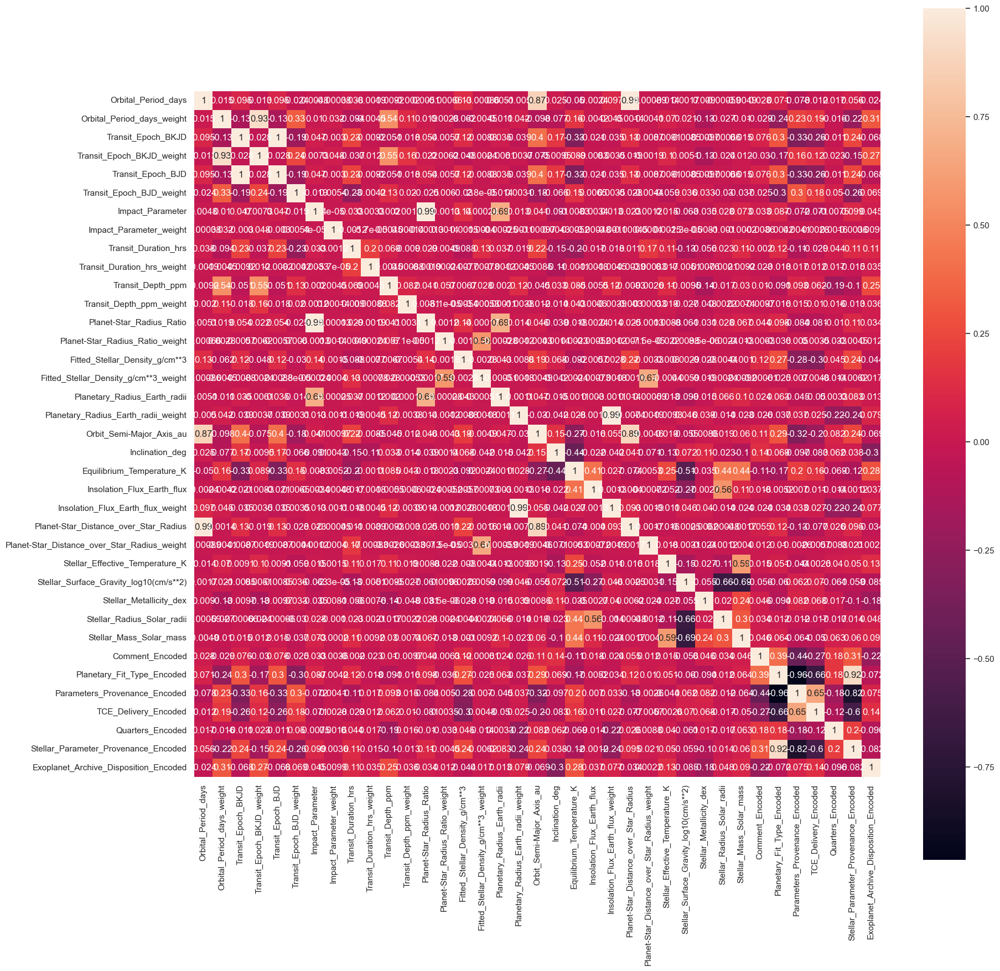

In [81]:
plt.subplots(figsize=(20,20))
sns.heatmap(new_exo_data.corr(), square=True, annot=True)
plt.show()

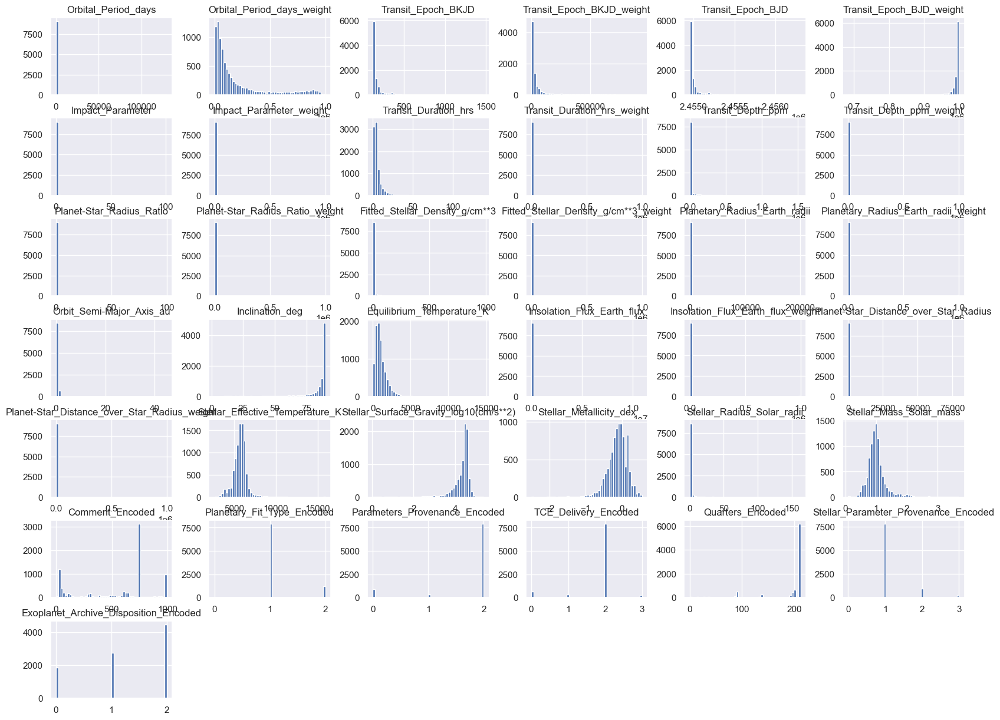

In [82]:
new_exo_data.hist(bins=50, figsize=(20,15))
plt.show()

In [83]:
new_exo_data.describe()

,Orbital_Period_days,Orbital_Period_days_weight,Transit_Epoch_BKJD,Transit_Epoch_BKJD_weight,Transit_Epoch_BJD,Transit_Epoch_BJD_weight,Impact_Parameter,Impact_Parameter_weight,Transit_Duration_hrs,Transit_Duration_hrs_weight,...,Stellar_Metallicity_dex,Stellar_Radius_Solar_radii,Stellar_Mass_Solar_mass,Comment_Encoded,Planetary_Fit_Type_Encoded,Parameters_Provenance_Encoded,TCE_Delivery_Encoded,Quarters_Encoded,Stellar_Parameter_Provenance_Encoded,Exoplanet_Archive_Disposition_Encoded
count,9086.000000,9086.000000,9086.000000,9086.000000,9.086000e+03,9086.000000,9086.000000,9086.000000,9086.000000,9086.000000,...,9086.000000,9086.000000,9086.000000,9086.000000,9086.000000,9086.000000,9086.000000,9086.000000,9086.000000,9086.000000
mean,74.478858,204519.076921,165.556036,82074.942935,2.454999e+06,992344.698578,0.725709,116.967074,5.622419,1978.131266,...,-0.123833,1.672838,1.022109,539.523002,1.130641,1.773168,1.855052,188.747854,1.146819,1.288576
std,1369.056745,254252.356520,67.368628,154273.389941,6.736863e+01,15529.218206,3.285379,10490.890664,6.393897,43214.885891,...,0.281889,5.276450,0.346151,332.980546,0.337352,0.606287,0.562260,47.436693,0.441908,0.784506
min,0.241843,158.614090,120.515914,117.200675,2.454954e+06,683270.068107,0.000000,0.000002,0.167000,0.045455,...,-2.500000,0.109000,0.094000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2.696348,36877.460332,132.750213,7547.344205,2.454966e+06,991598.555900,0.197000,0.289878,2.454700,5.709285,...,-0.260000,0.828000,0.844000,144.000000,1.000000,2.000000,2.000000,200.000000,1.000000,1.000000
50%,9.311920,89671.595230,137.067915,17609.642905,2.454970e+06,996671.005265,0.537000,0.854419,3.823930,12.135643,...,-0.100000,0.999000,0.974000,711.000000,1.000000,2.000000,2.000000,211.000000,1.000000,1.000000
75%,37.009291,250698.185702,170.480793,61747.030725,2.455003e+06,999005.054304,0.888000,1.367811,6.275300,34.369740,...,0.070000,1.339000,1.100750,756.000000,1.000000,2.000000,2.000000,211.000000,1.000000,2.000000
max,129995.778400,1000000.000000,1472.522306,941719.409138,2.456306e+06,999992.912346,100.806000,1000000.000000,138.540000,1000000.000000,...,0.560000,162.725000,3.686000,995.000000,2.000000,2.000000,3.000000,212.000000,3.000000,2.000000


In [84]:
reserve_exo_data = new_exo_data[-100:]
new_exo_data = new_exo_data.iloc[:-100]

In [85]:
reserve_exo_data.shape

(100, 37)

In [86]:
new_exo_data.shape

(8986, 37)

## 6. Classification

In [87]:
### Predict whether a candidate is a confirmed exoplanet or a false positive.

### 6.1 KNN

In [88]:
# Outliers

import numpy as np
from scipy import stats

# Calculate Z-scores
z_scores = np.abs(stats.zscore(new_exo_data))
print("Z-scores calculated.")

# Define a threshold
threshold = 3

# Get boolean array of outliers
outliers = (z_scores > threshold)

# Identify outlier rows
outlier_indices = np.where(outliers.any(axis=1))[0]
print(f"Number of outlier rows: {len(outlier_indices)}")
print("Outlier rows indices:", outlier_indices)

Z-scores calculated.
Number of outlier rows: 2507
Outlier rows indices: [  10   11   12 ... 8976 8981 8982]


In [89]:
new_exo_data = new_exo_data.reset_index(drop=True)
cleaned_data = new_exo_data.drop(outlier_indices, axis=0)
print(f"Number of rows after removing outliers: {len(cleaned_data)}")

Number of rows after removing outliers: 6479


In [90]:
# Apply log transformation to specific columns
cleaned_data['Log_Orbital_Period'] = np.log(cleaned_data['Orbital_Period_days'] + 1)
cleaned_data['Log_Transit_Depth'] = np.log(cleaned_data['Transit_Depth_ppm'] + 1)

In [91]:
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler

y = cleaned_data["Exoplanet_Archive_Disposition_Encoded"]
X = cleaned_data.drop(columns="Exoplanet_Archive_Disposition_Encoded", axis=1)

# Scaling
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
X_scaled = pd.DataFrame(X_scaled)

In [133]:
def get_accuracy(model, X_train, X_test, y_train, y_test):
    
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    train_accuracy = accuracy_score(y_train, y_train_pred)
    test_accuracy = accuracy_score(y_test, y_test_pred)

    return test_accuracy

In [93]:
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.33/2, random_state=42)

In [94]:
print(X_train.shape)
print(y_train.shape)

(5409, 38)
(5409,)


In [95]:
print(X_test.shape)
print(y_test.shape)

(1070, 38)
(1070,)


In [96]:
KNN = KNeighborsClassifier(n_neighbors=3)
KNN.fit(X_train, y_train)

y_train_pred = KNN.predict(X_train)
print(f"{round(accuracy_score(y_train, y_train_pred)* 100, 2)}")

y_test_pred = KNN.predict(X_test)
print(f"{round(accuracy_score(y_test, y_test_pred)* 100, 2)}")

86.21
76.54


In [97]:
for i in range(0, 10):
    print(f"{reserve_exo_data['Exoplanet_Archive_Disposition_Encoded'].values[i]} - {y_test_pred[i]}")

2 - 0
2 - 2
2 - 1
2 - 1
2 - 2
2 - 2
2 - 1
2 - 1
2 - 0
2 - 2


### 6.2 KNN with Cross Validation

In [98]:
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.33/2, random_state=42)
X_train, X_cv, y_train, y_cv = train_test_split(X_train, y_train, test_size=0.33/2, random_state=20)

KNN_cv = KNeighborsClassifier(n_neighbors=3)
KNN_cv.fit(X_train, y_train)

y_train_pred = KNN_cv.predict(X_train)
y_test_pred = KNN_cv.predict(X_test)
y_cv_pred = KNN_cv.predict(X_cv)

print(f"Accuracy score Train: {round(accuracy_score(y_train, y_train_pred)* 100, 2)}")
print(f"Accuracy score Test: {round(accuracy_score(y_test, y_test_pred)* 100, 2)}")
print(f"Accuracy score Cross Validation: {round(accuracy_score(y_cv, y_cv_pred)* 100, 2)}")

Accuracy score Train: 86.05
Accuracy score Test: 75.61
Accuracy score Cross Validation: 75.25


### 6.3 K-Fold Validation

In [141]:
import pandas as pd
import numpy as np
from sklearn.metrics import accuracy_score
from sklearn.model_selection import KFold

y_KF = cleaned_data["Exoplanet_Archive_Disposition_Encoded"]
X_KF = cleaned_data.drop(columns="Exoplanet_Archive_Disposition_Encoded", axis=1)

# Scaling
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_KF)
X_scaled = pd.DataFrame(X_scaled)

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_KF, test_size=0.33, random_state=500)
accuracies = []

X_train = X_train.reset_index(drop=True)
y_train = y_train.reset_index(drop=True)

kf = KFold(n_splits=5)
kf.get_n_splits(X_train)
print(kf)

for i, (train_index, cv_index) in enumerate(kf.split(X_train)):
    KNN_KF = KNeighborsClassifier(n_neighbors=10)
    KNN_KF.fit(X_train.iloc[train_index], y_train.iloc[train_index])
    y_train_pred = KNN_KF.predict(X_train.iloc[train_index])
    y_cv_pred = KNN_KF.predict(X_train.iloc[cv_index])
    train_accuracy = accuracy_score(y_train[train_index], y_train_pred)
    cv_accuracy = accuracy_score(y_train[cv_index], y_cv_pred)
    print("CV Accuracy:", cv_accuracy)
    accuracies.append(cv_accuracy)
print("Mean CV accuracy: ", np.mean(accuracies))

KFold(n_splits=5, random_state=None, shuffle=False)
CV Accuracy: 0.7788018433179723
CV Accuracy: 0.7453917050691244
CV Accuracy: 0.7488479262672811
CV Accuracy: 0.7488479262672811
CV Accuracy: 0.7465437788018433
Mean CV accuracy:  0.7536866359447005


In [100]:
train_index

array([   0,    1,    2, ..., 3469, 3470, 3471])

### 6.4 Random Forrest

In [101]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_KF, test_size=0.33, random_state=500)
accuracies = []


X_train = X_train.reset_index(drop=True)
y_train = y_train.reset_index(drop=True)

kf2 = KFold(n_splits=5)
kf2.get_n_splits(X_train)
print(kf2)

for i, (train_index, cv_index) in enumerate(kf2.split(X_train)):
    rf_KF = RandomForestClassifier(n_estimators=50, max_depth=10, random_state=0)
    rf_KF.fit(X_train.iloc[train_index], y_train.iloc[train_index])
    y_train_pred = rf_KF.predict(X_train.iloc[train_index])
    y_cv_pred = rf_KF.predict(X_train.iloc[cv_index])
    train_accuracy = accuracy_score(y_train[train_index], y_train_pred)
    cv_accuracy = accuracy_score(y_train[cv_index], y_cv_pred)
    print("CV Accuracy:", cv_accuracy)
    accuracies.append(cv_accuracy)
print("Mean CV accuracy: ", np.mean(accuracies))

KFold(n_splits=5, random_state=None, shuffle=False)
CV Accuracy: 0.868663594470046
CV Accuracy: 0.8536866359447005
CV Accuracy: 0.868663594470046
CV Accuracy: 0.8490783410138248
CV Accuracy: 0.8548387096774194
Mean CV accuracy:  0.8589861751152073


In [102]:
from sklearn.metrics import confusion_matrix

y_test_pred = rf_KF.predict(X_test)

conf_matrix = confusion_matrix(y_test, y_test_pred)
print(f"Confusion Matrix for the Test Set:\n {conf_matrix}")

Confusion Matrix for the Test Set:
 [[237  99  66]
 [ 75 782  18]
 [ 24  23 815]]


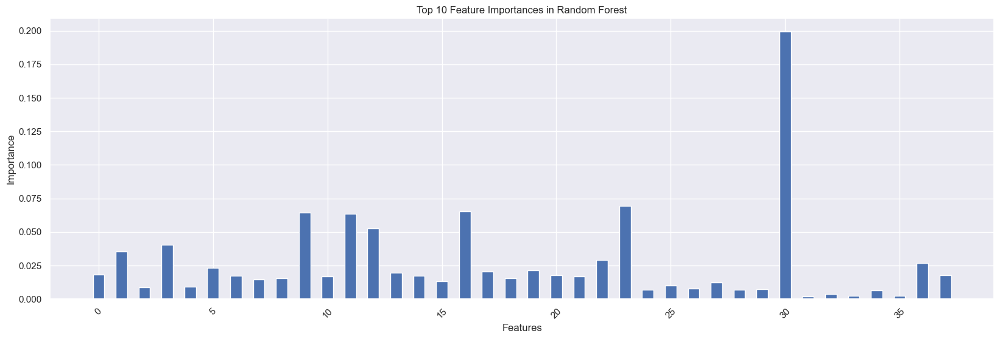

In [103]:
import matplotlib.pyplot as plt
import numpy as np

feature_importances = rf_KF.feature_importances_
feature_names = X_train.columns

sorted_indices = np.argsort(feature_importances)[::-1]
sorted_feature_importances = np.array(feature_importances)[sorted_indices]
sorted_feature_names = np.array(feature_names)[sorted_indices]

top_n = 40
top_n_indices = sorted_indices[:top_n]
top_n_feature_importances = sorted_feature_importances[:top_n]
top_n_feature_names = sorted_feature_names[:top_n]

plt.figure(figsize=(20, 6))
plt.title("Top 10 Feature Importances in Random Forest")
plt.bar(top_n_feature_names, top_n_feature_importances, width=0.5)
plt.xlabel("Features")
plt.ylabel("Importance")
plt.xticks(rotation=45)
plt.show()

### 6.5 Gradient Boosting

In [104]:
from sklearn.ensemble import GradientBoostingClassifier

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_KF, test_size=0.33, random_state=500)
accuracies = []


X_train = X_train.reset_index(drop=True)
y_train = y_train.reset_index(drop=True)

kf3 = KFold(n_splits=5)
kf3.get_n_splits(X_train)
print(kf2)

for i, (train_index, cv_index) in enumerate(kf3.split(X_train)):
    gbc = GradientBoostingClassifier(max_depth=5, n_estimators=100, learning_rate=0.2)
    gbc.fit(X_train.iloc[train_index], y_train.iloc[train_index])
    y_train_pred = gbc.predict(X_train.iloc[train_index])
    y_cv_pred = gbc.predict(X_train.iloc[cv_index])
    train_accuracy = accuracy_score(y_train[train_index], y_train_pred)
    cv_accuracy = accuracy_score(y_train[cv_index], y_cv_pred)
    print("CV Accuracy:", cv_accuracy)
    accuracies.append(cv_accuracy)
print("Mean CV accuracy: ", np.mean(accuracies))

KFold(n_splits=5, random_state=None, shuffle=False)
CV Accuracy: 0.8894009216589862
CV Accuracy: 0.8652073732718893
CV Accuracy: 0.8882488479262672
CV Accuracy: 0.8594470046082949
CV Accuracy: 0.8744239631336406
Mean CV accuracy:  0.8753456221198157


### 6.6 LightGBM

In [105]:
from lightgbm import LGBMClassifier

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_KF, test_size=0.33, random_state=500)
accuracies = []


X_train = X_train.reset_index(drop=True)
y_train = y_train.reset_index(drop=True)

kf4 = KFold(n_splits=5)
kf4.get_n_splits(X_train)
print(kf4)

for i, (train_index, cv_index) in enumerate(kf4.split(X_train)):
    lgbm = LGBMClassifier(boosting_type='gbdt',
                          colsample_bytree=1.0,
                          learning_rate=0.1,
                          max_depth=5,
                          min_child_samples=10,
                          n_estimators=100,
                          num_leaves=20,
                          objective='multiclass',
                          subsample=1.0)
    lgbm.fit(X_train.iloc[train_index], y_train.iloc[train_index])
    y_train_pred = lgbm.predict(X_train.iloc[train_index])
    y_cv_pred = lgbm.predict(X_train.iloc[cv_index])
    train_accuracy = accuracy_score(y_train[train_index], y_train_pred)
    cv_accuracy = accuracy_score(y_train[cv_index], y_cv_pred)
    print("CV Accuracy:", cv_accuracy)
    accuracies.append(cv_accuracy)
print("Mean CV accuracy: ", np.mean(accuracies))

KFold(n_splits=5, random_state=None, shuffle=False)
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000871 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 8245
[LightGBM] [Info] Number of data points in the train set: 3472, number of used features: 38
[LightGBM] [Info] Start training from score -1.594288
[LightGBM] [Info] Start training from score -0.903271
[LightGBM] [Info] Start training from score -0.937246
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posi

### 6.7 Neural Network

In [145]:
import tensorflow as tf
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.optimizers import Adam


# Splitting the dataset
X_train_nn, X_test_nn, y_train_nn, y_test_nn = train_test_split(X, y, test_size=0.33/2, random_state=500)
X_train_nn, X_cv_nn, y_train_nn, y_cv_nn = train_test_split(X_train_nn, y_train_nn, test_size=0.33/2, random_state=500)


# Scaling the data
scaler_nn = StandardScaler()
X_train_nn = scaler.fit_transform(X_train_nn)
X_cv_nn = scaler.transform(X_cv_nn)
X_test_nn = scaler.transform(X_test_nn)

# One-hot encode the labels for multiclass classification
y_train_nn = to_categorical(y_train_nn, num_classes=3)
y_cv_nn = to_categorical(y_cv_nn, num_classes=3)
y_test_nn = to_categorical(y_test_nn, num_classes=3)

# Define the model architecture for multiclass classification
model = tf.keras.Sequential([
    tf.keras.layers.Input(shape=(X_train_nn.shape[1],)),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(3, activation='sigmoid')  # 3 output neurons, one for each class
])

# Compile the model for multiclass classification
model.compile(optimizer=Adam(learning_rate=0.01), loss='categorical_crossentropy', metrics=['accuracy'])

# Learning rate scheduler callback
lr_scheduler = ReduceLROnPlateau(factor=0.5, patience=3)

# Early stopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model
history = model.fit(X_train_nn, y_train_nn, epochs=50, validation_data=(X_cv_nn, y_cv_nn), batch_size=64,
                    callbacks=[lr_scheduler, early_stopping], verbose=1)


Epoch 1/50
71/71 [==============================] - 1s 6ms/step - loss: 0.5972 - accuracy: 0.7620 - val_loss: 0.5533 - val_accuracy: 0.7794 - lr: 0.0100
Epoch 2/50
71/71 [==============================] - 0s 2ms/step - loss: 0.5035 - accuracy: 0.7992 - val_loss: 0.5211 - val_accuracy: 0.7794 - lr: 0.0100
Epoch 3/50
71/71 [==============================] - 0s 2ms/step - loss: 0.4612 - accuracy: 0.8140 - val_loss: 0.4833 - val_accuracy: 0.8063 - lr: 0.0100
Epoch 4/50
71/71 [==============================] - 0s 2ms/step - loss: 0.4328 - accuracy: 0.8226 - val_loss: 0.4973 - val_accuracy: 0.8085 - lr: 0.0100
Epoch 5/50
71/71 [==============================] - 0s 2ms/step - loss: 0.4209 - accuracy: 0.8291 - val_loss: 0.4416 - val_accuracy: 0.8186 - lr: 0.0100
Epoch 6/50
71/71 [==============================] - 0s 2ms/step - loss: 0.4028 - accuracy: 0.8361 - val_loss: 0.4712 - val_accuracy: 0.8108 - lr: 0.0100
Epoch 7/50
71/71 [==============================] - 0s 2ms/step - loss: 0.3943 - a

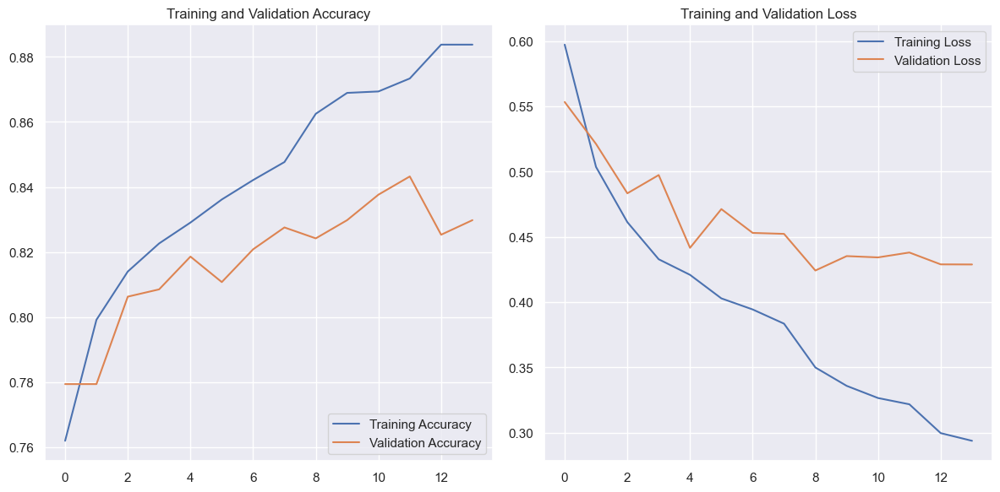

In [146]:
import matplotlib.pyplot as plt


training_accuracy = history.history['accuracy']
validation_accuracy = history.history['val_accuracy']

training_loss = history.history['loss']
validation_loss = history.history['val_loss']

epochs_range = range(len(history.history['loss']))

plt.figure(figsize=(12, 6))

# Plot Training and Validation Accuracy
plt.subplot(1, 2, 1)
plt.plot(epochs_range, training_accuracy, label='Training Accuracy')
plt.plot(epochs_range, validation_accuracy, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

# Plot Training and Validation Loss
plt.subplot(1, 2, 2)
plt.plot(epochs_range, training_loss, label='Training Loss')
plt.plot(epochs_range, validation_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')

plt.tight_layout()
plt.show()

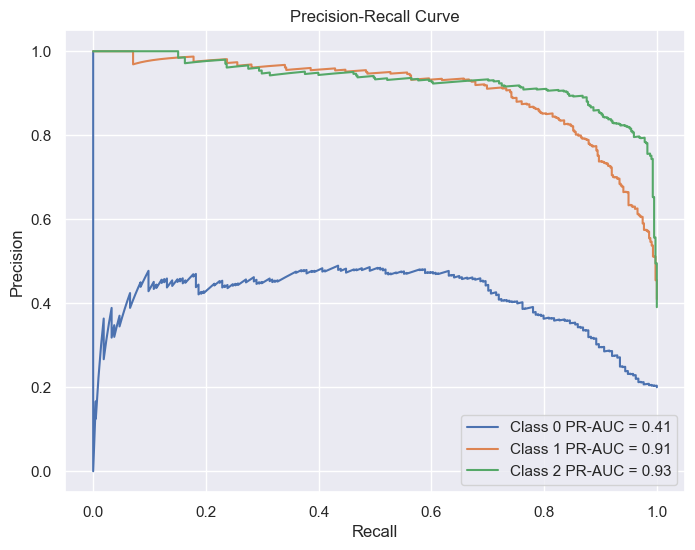

In [147]:
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_curve, auc
from sklearn.preprocessing import label_binarize

# Get probability predictions for each class
y_pred_prob = model.predict(X_test_nn, verbose=0)

# Binarize the output labels
y_test_binarized = label_binarize(y_test_nn, classes=[0, 1, 2])

# Initialize lists to store precision-recall values
precision = {}
recall = {}
auc_score = {}

# Compute precision-recall curve and AUC for each class
for i in range(3):  # For each class
    precision[i], recall[i], _ = precision_recall_curve(y_test_binarized[:, i], y_pred_prob[:, i])
    auc_score[i] = auc(recall[i], precision[i])

# Plot Precision-Recall curves for each class
plt.figure(figsize=(8, 6))
for i in range(3):
    plt.plot(recall[i], precision[i], label=f'Class {i} PR-AUC = {auc_score[i]:.2f}')

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend()
plt.show()

### 6.8 Comparsion of the Models

In [149]:
models = pd.DataFrame({
    'Model': ['K-Neighbors Classifier',
              'Random Forest Classifier',
              'Gradient oosting Classifier',
              'K-Neighbors Classifier'],
    
    'Score': [get_accuracy(KNN_KF, X_train, X_test, y_train, y_test),
              get_accuracy(rf_KF, X_train, X_test, y_train, y_test),
              get_accuracy(gbc, X_train, X_test, y_train, y_test),
              get_accuracy(lgbm, X_train, X_test, y_train, y_test),
             ]})

models.sort_values(by='Score', ascending=False)

,Model,Score
3,K-Neighbors Classifier,0.874708
2,Gradient oosting Classifier,0.871903
1,Random Forest Classifier,0.857410
0,K-Neighbors Classifier,0.768583


## 7. Regression

In [150]:
### Predict the size or other attributes of an exoplanet.

### 7.1 Linear Regression

In [151]:
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats

regression_features = [ "Orbital_Period_days",
                        "Stellar_Radius_Solar_radii",
                        "Stellar_Effective_Temperature_K",
                        "Stellar_Mass_Solar_mass",
                        "Planet-Star_Distance_over_Star_Radius",
                      ]

In [152]:
reg_exo_data = exo_data[regression_features]

In [153]:
reg_exo_data.shape

(9110, 5)

In [154]:
reg_exo_data.isnull().sum()

Orbital_Period_days                      0
Stellar_Radius_Solar_radii               0
Stellar_Effective_Temperature_K          0
Stellar_Mass_Solar_mass                  0
Planet-Star_Distance_over_Star_Radius    0
dtype: int64

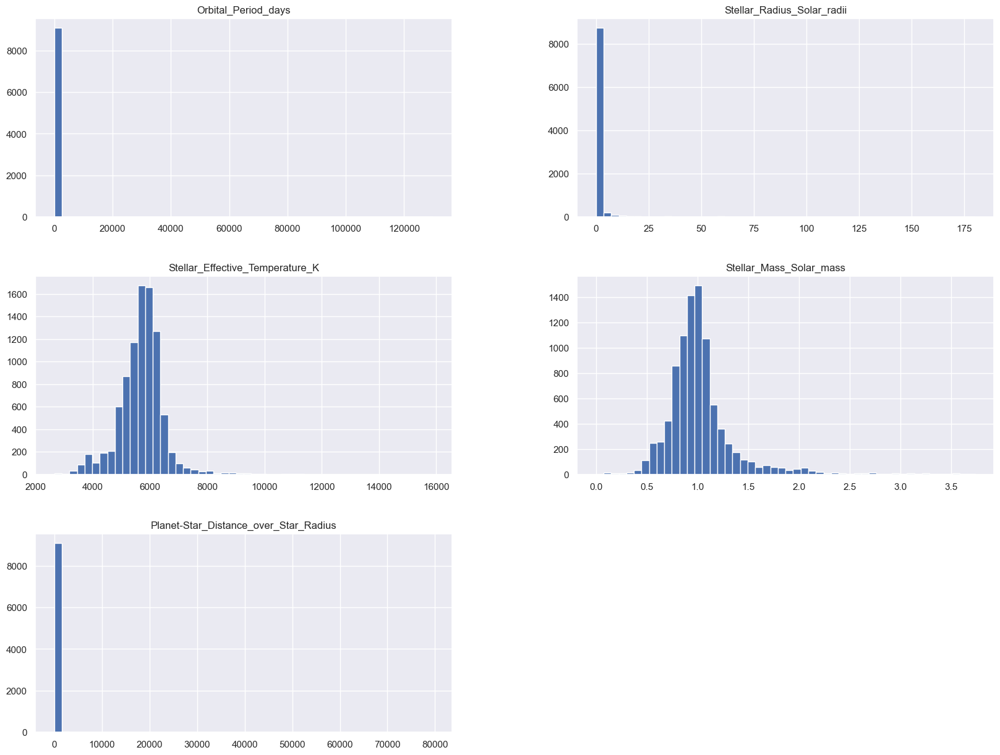

In [155]:
reg_exo_data.hist(bins=50, figsize=(20,15))
plt.show()

In [156]:
# Outliers

In [157]:
import numpy as np
from scipy import stats

# Calculate Z-scores
z_scores = np.abs(stats.zscore(reg_exo_data))
print("Z-scores calculated.")

# Define a threshold
threshold = 3

# Get boolean array of outliers
outliers = (z_scores > threshold)

# Identify outlier rows
outlier_indices = np.where(outliers.any(axis=1))[0]
print(f"Number of outlier rows: {len(outlier_indices)}")
print("Outlier rows indices:", outlier_indices)

Z-scores calculated.
Number of outlier rows: 272
Outlier rows indices: [ 312  330  340  368  369  394  432  437  442  512  599  623  642  643
  645  646  727  768  937 1106 1387 1608 1809 1837 1976 2041 2103 2171
 2184 2233 2296 2297 2390 2400 2489 2520 2532 2590 2641 2761 2768 2818
 2927 2996 3005 3052 3158 3202 3323 3437 3493 3589 3674 3681 3685 3688
 3689 3725 3737 3774 3806 3861 4026 4106 4155 4183 4184 4341 4385 4399
 4433 4581 4602 4683 4723 4782 4815 4864 4897 4925 4967 5091 5166 5206
 5250 5284 5295 5324 5356 5362 5374 5384 5389 5392 5417 5430 5433 5450
 5457 5463 5490 5507 5522 5597 5755 5765 5772 5798 5844 5892 5943 5951
 5965 5970 5977 5984 5998 6005 6018 6023 6050 6068 6096 6097 6102 6107
 6115 6122 6144 6154 6194 6205 6235 6249 6273 6290 6305 6315 6347 6373
 6375 6420 6452 6458 6480 6483 6486 6512 6516 6551 6595 6643 6661 6675
 6698 6708 6781 6864 6871 6936 6939 6941 6956 6964 7029 7062 7121 7139
 7140 7166 7175 7184 7222 7230 7267 7305 7306 7307 7316 7335 7340 7371
 7372 

In [158]:
reg_exo_data = reg_exo_data.reset_index(drop=True)
cleaned_data = reg_exo_data.drop(outlier_indices, axis=0)
print(f"Number of rows after removing outliers: {len(cleaned_data)}")

Number of rows after removing outliers: 8838


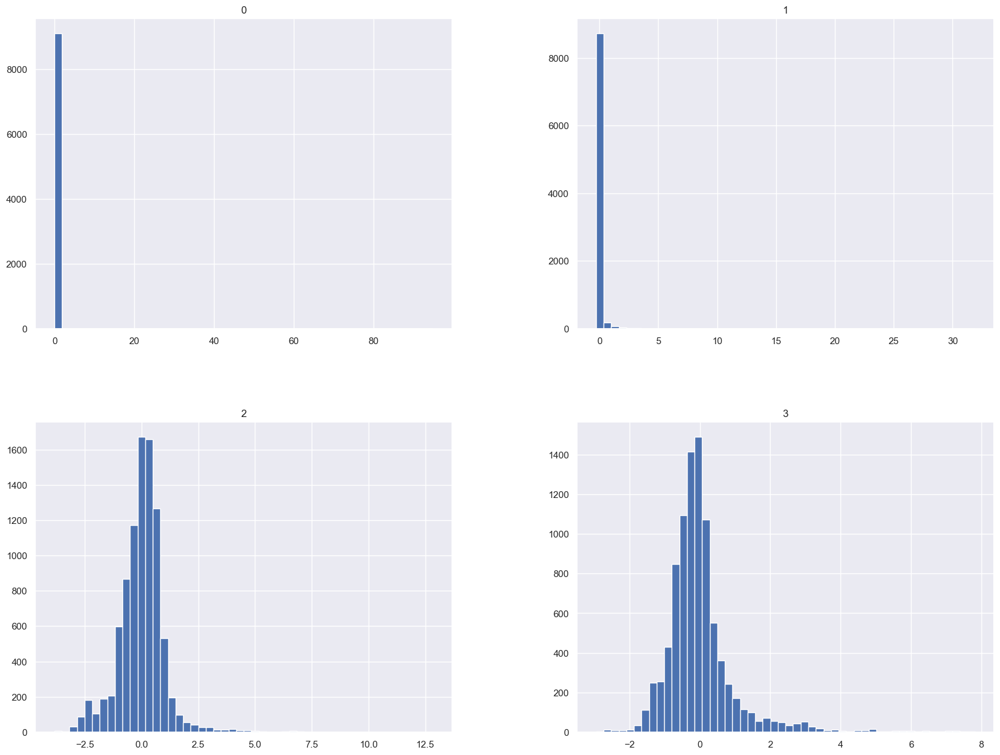

In [159]:
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split, KFold
from sklearn.preprocessing import StandardScaler


# Prepare your data
y_LR = reg_exo_data["Planet-Star_Distance_over_Star_Radius"]
X_LR = reg_exo_data.drop(columns=["Planet-Star_Distance_over_Star_Radius"])

# Scaling
scaler = StandardScaler()
X_LR_scaled = scaler.fit_transform(X_LR)

X_LR_scaled = pd.DataFrame(X_LR_scaled)

X_LR_scaled.hist(bins=50, figsize=(20,15))
plt.show()

In [160]:
from sklearn.preprocessing import MinMaxScaler

y_orig = reg_exo_data["Planet-Star_Distance_over_Star_Radius"].values.reshape(-1, 1)

scaler = MinMaxScaler()
y = scaler.fit_transform(y_orig)

In [161]:
X_train, X_test, y_train, y_test = train_test_split(X_LR_scaled, y, test_size=0.33/2, random_state=42)
X_train, X_cv, y_train, y_cv = train_test_split(X_train, y_train, test_size=0.33/2, random_state=20)

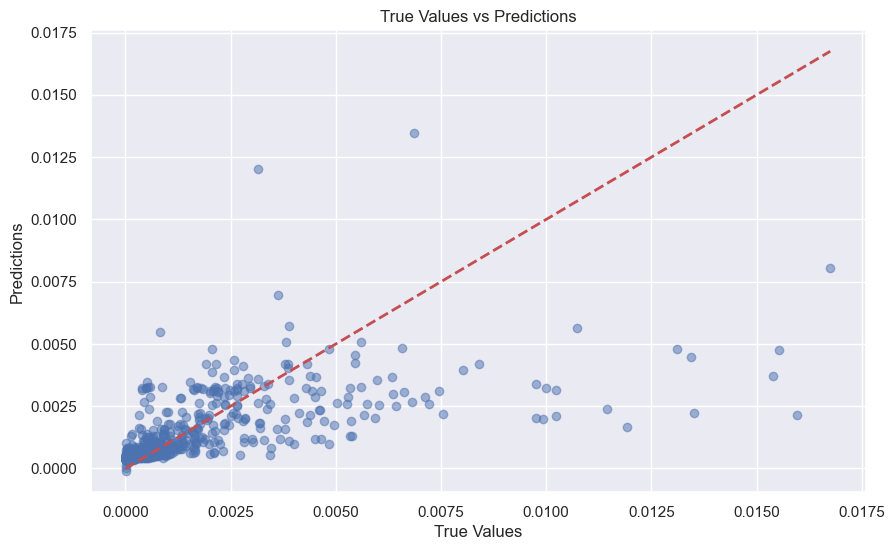

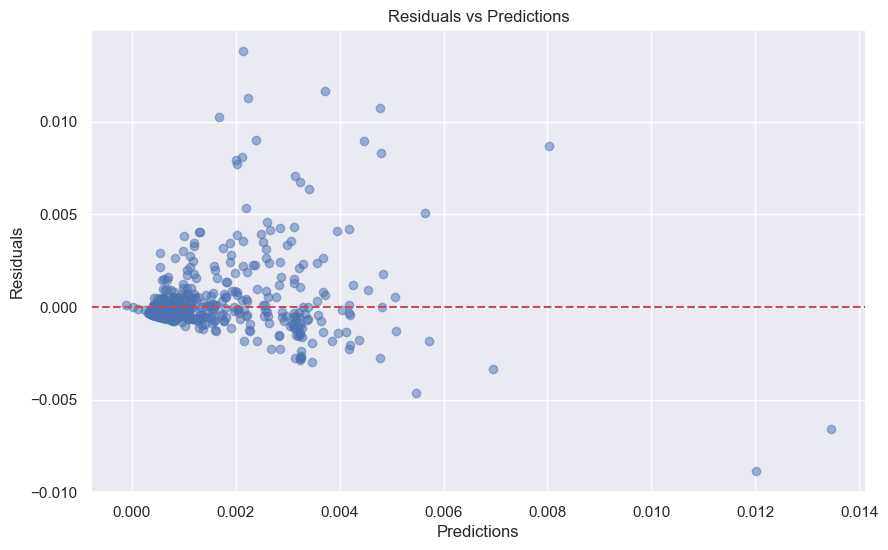

In [162]:
import matplotlib.pyplot as plt

# Fit model on full training set
reg = LinearRegression()
reg.fit(X_train, y_train)

# Predict on test set
y_test_pred = reg.predict(X_test)

# Plot predictions vs actual values
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_test_pred, alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
plt.xlabel('True Values')
plt.ylabel('Predictions')
plt.title('True Values vs Predictions')
plt.show()

# Plot residuals
residuals = y_test - y_test_pred
plt.figure(figsize=(10, 6))
plt.scatter(y_test_pred, residuals, alpha=0.5)
plt.axhline(0, color='r', linestyle='--')
plt.xlabel('Predictions')
plt.ylabel('Residuals')
plt.title('Residuals vs Predictions')
plt.show()

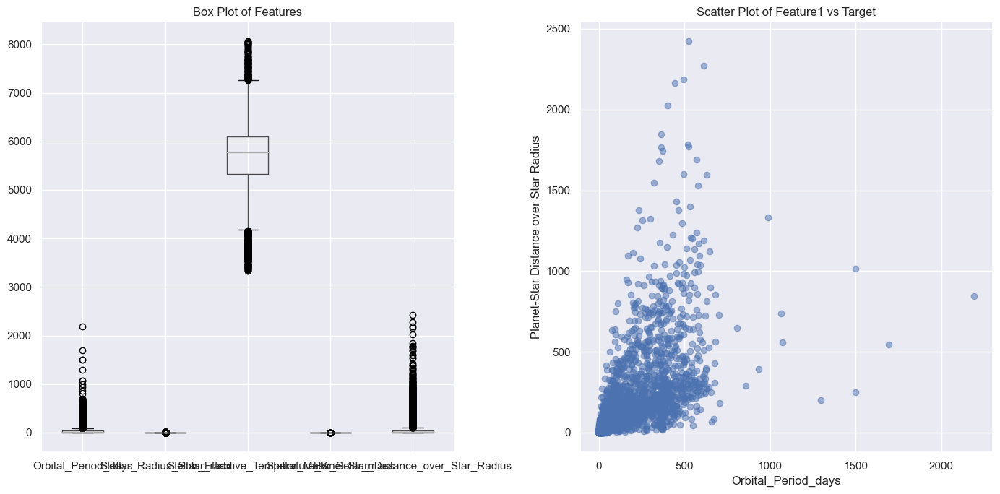

Outliers detected using Z-score:
      Orbital_Period_days  Stellar_Radius_Solar_radii  \
29             670.645531                       0.983   
170             56.056075                       0.491   
244              7.113733                       0.411   
245              3.306552                       0.411   
246             15.368457                       0.411   
...                   ...                         ...   
9095           361.901618                       0.717   
9096           508.041030                       0.965   
9096           508.041030                       0.965   
9101           522.646130                       0.318   
9101           522.646130                       0.318   

      Stellar_Effective_Temperature_K  Stellar_Mass_Solar_mass  \
29                             5520.0                    1.030   
170                            3593.0                    0.503   
244                            3561.0                    0.440   
245               

In [163]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import stats

# Assuming new_exo_data is your DataFrame
data = cleaned_data.copy()

# Z-Score Method
z_scores = np.abs(stats.zscore(data))
outliers_z_score = np.where(z_scores > 3)

# IQR Method
Q1 = data.quantile(0.25)
Q3 = data.quantile(0.75)
IQR = Q3 - Q1
outliers_iqr = ((data < (Q1 - 1.5 * IQR)) | (data > (Q3 + 1.5 * IQR)))

# Plotting
plt.figure(figsize=(14, 7))

# Box Plot for each feature
plt.subplot(1, 2, 1)
data.boxplot()
plt.title('Box Plot of Features')

# Scatter Plot of the target feature vs. predictions (example)
plt.subplot(1, 2, 2)
plt.scatter(data["Orbital_Period_days"], data["Planet-Star_Distance_over_Star_Radius"], alpha=0.5)
plt.xlabel('Orbital_Period_days')
plt.ylabel('Planet-Star Distance over Star Radius')
plt.title('Scatter Plot of Feature1 vs Target')

plt.tight_layout()
plt.show()

# Show outliers
print("Outliers detected using Z-score:")
print(data.iloc[outliers_z_score[0]])

print("\nOutliers detected using IQR:")
print(data[outliers_iqr].dropna())

### 7.2 Ridge

In [164]:
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_absolute_error

ridge_model = Ridge(alpha=0.1)
ridge_model.fit(X_train, y_train)

y_pred_ridge = ridge_model.predict(X_test)

mae_ridge = mean_absolute_error(y_test, y_pred_ridge)
print("Model coefficients:", ridge_model.coef_)
print("Intercept:", ridge_model.intercept_)

print("Mean Absolute Error (MAE) with Ridge: ", mae_ridge)
print("Ridge Score: ", ridge_model.score(X_test, y_test))

Model coefficients: [[ 1.05437446e-02 -2.44060816e-05 -5.37025019e-05  7.32722349e-05]]
Intercept: [0.00096933]
Mean Absolute Error (MAE) with Ridge:  0.0005607483211626574
Ridge Score:  0.4601746834295115


In [165]:
y_pred_ridge = ridge_model.predict(X_cv)

mae_ridge = mean_absolute_error(y_cv, y_pred_ridge)
print("Model coefficients:", ridge_model.coef_)
print("Intercept:", ridge_model.intercept_)

print("Mean Absolute Error (MAE) with Ridge: ", mae_ridge)
print("Ridge Score: ", ridge_model.score(X_cv, y_cv))

Model coefficients: [[ 1.05437446e-02 -2.44060816e-05 -5.37025019e-05  7.32722349e-05]]
Intercept: [0.00096933]
Mean Absolute Error (MAE) with Ridge:  0.0006747208608475173
Ridge Score:  0.4057201185978512


### 7.3 Lasso

In [166]:
from sklearn.linear_model import Lasso
from sklearn.metrics import mean_absolute_error

lasso_model = Lasso(alpha=0.1)
lasso_model.fit(X_train, y_train)

y_pred_lasso = lasso_model.predict(X_test)

mae_lasso = mean_absolute_error(y_test, y_pred_lasso)
print("Model coefficients:", lasso_model.coef_)
print("Intercept:", lasso_model.intercept_)

print("Mean Absolute Error (MAE) with Lasso: ", mae_lasso)
print("Lasso Score: ", lasso_model.score(X_test, y_test))

Model coefficients: [ 0. -0. -0. -0.]
Intercept: [0.00102901]
Mean Absolute Error (MAE) with Lasso:  0.0010792796563550274
Lasso Score:  -0.030651729348027734


In [167]:
y_pred_lasso = lasso_model.predict(X_cv)

mae_lasso = mean_absolute_error(y_cv, y_pred_lasso)
print("Model coefficients:", lasso_model.coef_)
print("Intercept:", lasso_model.intercept_)

print("Mean Absolute Error (MAE) with Lasso: ", mae_lasso)
print("Lasso Score: ", lasso_model.score(X_cv, y_cv))

Model coefficients: [ 0. -0. -0. -0.]
Intercept: [0.00102901]
Mean Absolute Error (MAE) with Lasso:  0.0012450075908227957
Lasso Score:  -0.0034737236287938345


### 7.4 RandomForestRegressor

In [168]:
from sklearn.ensemble import RandomForestRegressor

rfr = RandomForestRegressor(n_estimators=50, max_depth=10, random_state=0)
rfr.fit(X_train, y_train)

y_pred_rfr = rfr.predict(X_test)

mae_rfr = mean_absolute_error(y_test, y_pred_rfr)

print("Mean Absolute Error (MAE) with Random Forest Regressor: ", mae_rfr)

/home/ros/.local/lib/python3.10/site-packages/sklearn/base.py:1473: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



Mean Absolute Error (MAE) with Random Forest Regressor:  0.00043744569221056676


### 7.5 Comparsion of the Models

In [169]:
def get_accuracy_reg(model, X_tr, y_tr):
    return model.score(X_tr, y_tr)

In [170]:
models = pd.DataFrame({
    'Model': ['LinearRegression', 'Ridge', 'Lasso', 'RandomForestRegressor'],
    'Score': [get_accuracy_reg(reg, X_test, y_test),
              get_accuracy_reg(ridge_model, X_test, y_test),
              get_accuracy_reg(lasso_model, X_test, y_test),
              get_accuracy_reg(rfr, X_test, y_test),
             ]})
models.sort_values(by='Score', ascending=False)

,Model,Score
3,RandomForestRegressor,0.485348
0,LinearRegression,0.460176
1,Ridge,0.460175
2,Lasso,-0.030652


## 8. Clustering

### 8.1 Features

In [171]:
### Group similar exoplanet candidates together.

In [172]:
clustering_features = [ "Orbital_Period_days",
                        "Planetary_Radius_Earth_radii",
                        "Stellar_Radius_Solar_radii",
                        "Stellar_Surface_Gravity_log10(cm/s**2)",
                        "Stellar_Effective_Temperature_K",
                        "Transit_Depth_ppm",
                        "Transit_Duration_hrs",
                        "Insolation_Flux_Earth_flux",
                        "Stellar_Mass_Solar_mass",
                        "Stellar_Metallicity_dex",
                      ]

In [173]:
cluster_exo_data = exo_data[clustering_features]

In [174]:
cluster_exo_data.shape

(9110, 10)

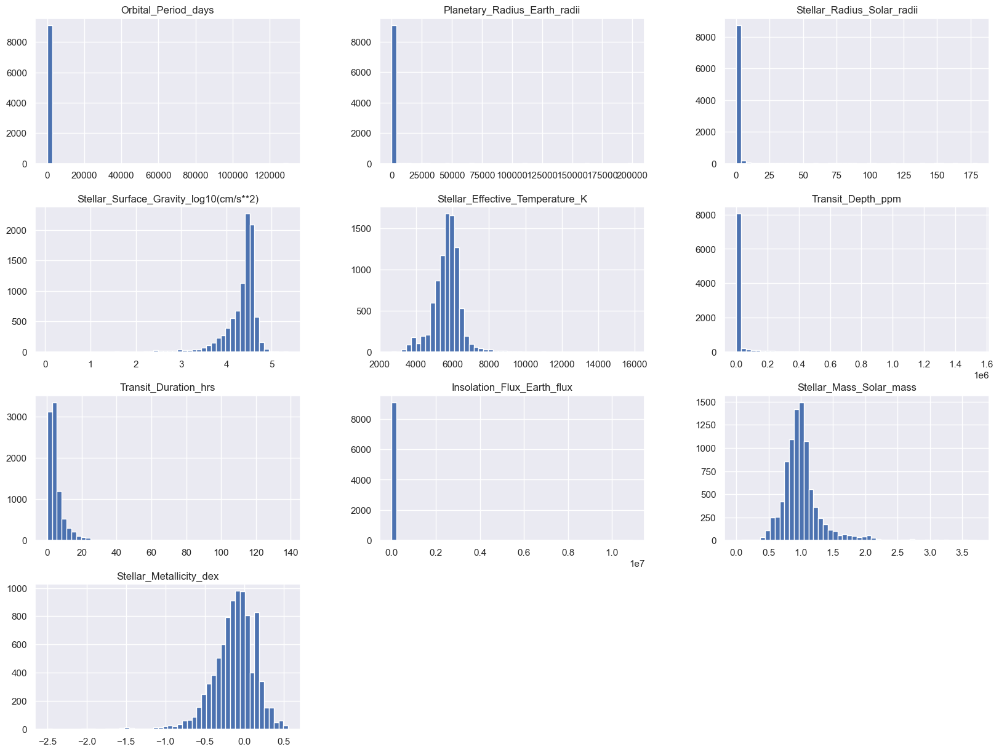

In [175]:
cluster_exo_data.hist(bins=50, figsize=(20,15))
plt.show()

In [176]:
cluster_exo_data.isnull().sum()

Orbital_Period_days                        0
Planetary_Radius_Earth_radii               0
Stellar_Radius_Solar_radii                 0
Stellar_Surface_Gravity_log10(cm/s**2)     0
Stellar_Effective_Temperature_K            0
Transit_Depth_ppm                          0
Transit_Duration_hrs                       0
Insolation_Flux_Earth_flux                 0
Stellar_Mass_Solar_mass                    0
Stellar_Metallicity_dex                   23
dtype: int64

In [177]:
cluster_exo_data = cluster_exo_data.dropna()

In [178]:
cluster_exo_data.isnull().sum()

Orbital_Period_days                       0
Planetary_Radius_Earth_radii              0
Stellar_Radius_Solar_radii                0
Stellar_Surface_Gravity_log10(cm/s**2)    0
Stellar_Effective_Temperature_K           0
Transit_Depth_ppm                         0
Transit_Duration_hrs                      0
Insolation_Flux_Earth_flux                0
Stellar_Mass_Solar_mass                   0
Stellar_Metallicity_dex                   0
dtype: int64

In [179]:
cluster_exo_data.shape

(9087, 10)

In [180]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_scaled = scaler.fit_transform(cluster_exo_data)

### 8.2 KMeans

In [181]:
from sklearn.cluster import KMeans

# Apply K-Means clustering with an initial guess of 3 clusters
kmeans = KMeans(n_clusters=5, random_state=42)
kmeans.fit(X_scaled)

# Get the cluster labels
labels = kmeans.labels_

# Add the labels back to your DataFrame for analysis
cluster_exo_data['Cluster'] = labels

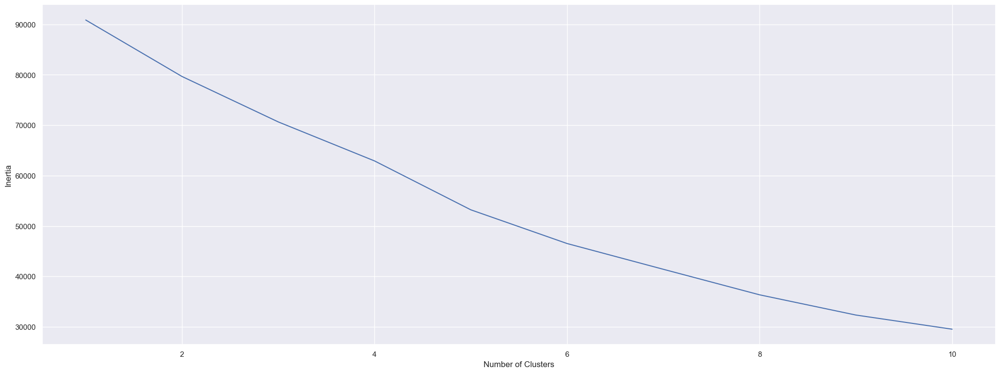

In [182]:
import matplotlib.pyplot as plt
inertia = []

# Try different numbers of clusters (k) and calculate inertia
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_scaled)
    inertia.append(kmeans.inertia_)

# Plot inertia to see the 'elbow'
plt.plot(range(1, 11), inertia)
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.show()

In [183]:
from sklearn.metrics import silhouette_score

score = silhouette_score(X_scaled, labels)
print(f'Silhouette Score: {score}')

Silhouette Score: 0.41781706233999355


### 8.3 PCA

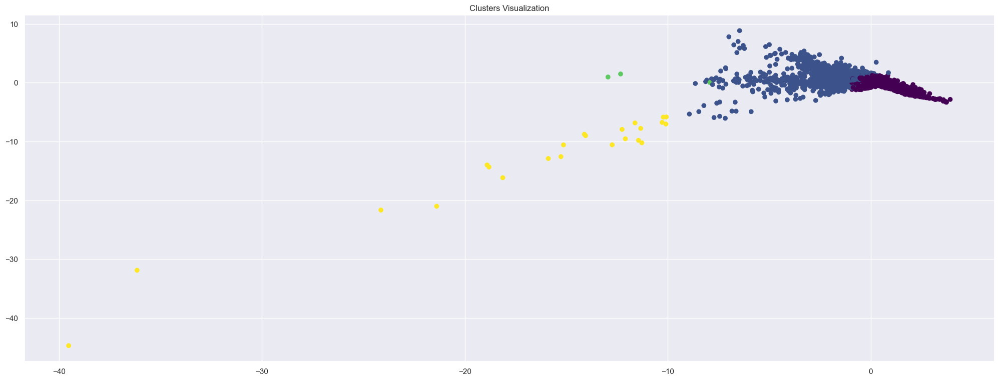

In [184]:
from sklearn.decomposition import PCA

pca = PCA(n_components=5)
X_pca = pca.fit_transform(X_scaled)

plt.scatter(X_pca[:, 0], X_pca[:, 1], c=labels, cmap='viridis')
plt.title('Clusters Visualization')
plt.show()

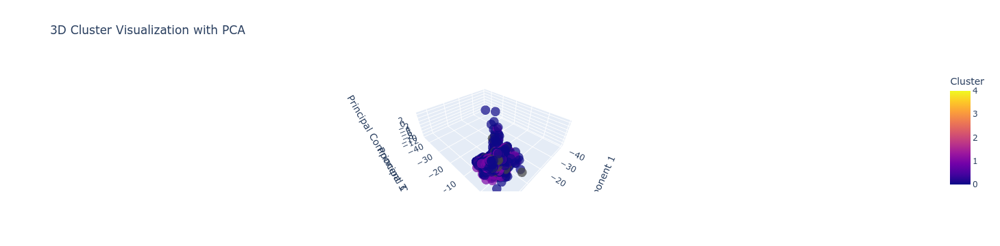

In [185]:
import pandas as pd
import plotly.express as px
from sklearn.decomposition import PCA

# Apply PCA to reduce the data to 3 components
pca = PCA(n_components=5)
X_pca = pca.fit_transform(X_scaled)

# Create a DataFrame with the PCA results and cluster labels
df_pca = pd.DataFrame(X_pca, columns=['PC1', 'PC2', 'PC3', 'PC4', 'PC5'])
df_pca['Cluster'] = cluster_exo_data['Cluster']

# Plot the clusters in 3D using Plotly
fig = px.scatter_3d(df_pca, x='PC1', y='PC2', z='PC3', color='Cluster',
                    title='3D Cluster Visualization with PCA',
                    labels={'PC1': 'Principal Component 1', 'PC2': 'Principal Component 2', 'PC3': 'Principal Component 3'},
                    opacity=0.7)

# Show the interactive plot
fig.show()


## 9. Fine-tuning and Optimization

In [186]:
### Fine-Tuning Gradient Boosting

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV, KFold



# Scaling
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_KF)
X_scaled = pd.DataFrame(X_scaled)

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_KF, test_size=0.33, random_state=500)
accuracies = []

X_train = X_train.reset_index(drop=True)
y_train = y_train.reset_index(drop=True)

kf_gb = KFold(n_splits=5)
kf_gb.get_n_splits(X_train)
param_grid_gb_expanded = {
        'n_estimators': [50, 100, 200],
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 5, 7, 10],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4],
        'subsample': [0.8, 0.9, 1.0],
        'max_features': [None, 'sqrt', 'log2', 0.5]
}

grid_search_gb = GridSearchCV(estimator=GradientBoostingClassifier(), param_grid=param_grid_gb_expanded,
                               cv=kf_gb, scoring='accuracy',  # Use an appropriate metric for classification
                               verbose=1, n_jobs=-1, return_train_score=True)

# Ensure y_train is 1D and binary
y_train = y_train.to_numpy()

grid_search_gb.fit(X_train, y_train)

mean_test_scores = grid_search_gb.cv_results_['mean_test_score']
mean_train_scores = grid_search_gb.cv_results_['mean_train_score']
n_estimators_range = param_grid_gb['n_estimators']

best_params_gb = grid_search_gb.best_params_
best_score_gb = grid_search_gb.best_score_

plt.figure(figsize=(10, 6))
plt.plot(n_estimators_range, mean_test_scores, label='Validation Accuracy', marker='o')
plt.plot(n_estimators_range, mean_train_scores, label='Train Accuracy', marker='x')
plt.xlabel('Number of Estimators (n_estimators)')
plt.ylabel('Accuracy')
plt.title('Train and Validation Accuracy vs Number of Estimators')
plt.legend()
plt.grid(True)
plt.show()

print(f"Best Parameters: {best_params_gb}")
print(f"Best Score (Accuracy): {best_score_gb}")

In [ ]:
### Fine-Tuning LGBM

In [194]:
import numpy as np
import matplotlib.pyplot as plt
from lightgbm import LGBMClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV, KFold


# Scaling
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_KF)
X_scaled = pd.DataFrame(X_scaled)

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_KF, test_size=0.33, random_state=500)
accuracies = []

X_train = X_train.reset_index(drop=True)
y_train = y_train.reset_index(drop=True)

kf_lgb = KFold(n_splits=5)
kf_lgb.get_n_splits(X_train)
param_grid_lgb_expanded = {
    'boosting_type': ['gbdt', 'dart'],
    'objective': ['multiclass'],
    'num_leaves': [20, 31, 40],
    'learning_rate': [0.01, 0.05, 0.1],
    'n_estimators': [30, 50, 70, 100],
    'max_depth': [3, 5, 7],
    'min_child_samples': [5, 10, 20],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 1.0],
}

grid_search_lgb = GridSearchCV(estimator=LGBMClassifier(), param_grid=param_grid_lgb_expanded,
                               cv=kf_lgb, scoring='accuracy',  # Use an appropriate metric for classification
                               verbose=1, n_jobs=-1, return_train_score=True)

# Ensure y_train is 1D and binary
y_train = y_train.to_numpy()

grid_search_lgb.fit(X_train, y_train)

mean_test_scores = grid_search_lgb.cv_results_['mean_test_score']
mean_train_scores = grid_search_lgb.cv_results_['mean_train_score']
n_estimators_range = param_grid_lgb['n_estimators']

best_params_lgb = grid_search_lgb.best_params_
best_score_lgb = grid_search_lgb.best_score_

plt.figure(figsize=(10, 6))
plt.plot(n_estimators_range, mean_test_scores, label='Validation Accuracy', marker='o')
plt.plot(n_estimators_range, mean_train_scores, label='Train Accuracy', marker='x')
plt.xlabel('Number of Estimators (n_estimators)')
plt.ylabel('Accuracy')
plt.title('Train and Validation Accuracy vs Number of Estimators')
plt.legend()
plt.grid(True)
plt.show()

print(f"Best Parameters: {best_params_lgb}")
print(f"Best Score (Accuracy): {best_score_lgb}")

Fitting 5 folds for each of 3888 candidates, totalling 19440 fits
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.050653 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 8257
[LightGBM] [Info] Number of data points in the train set: 3472, number of used features: 38
[LightGBM] [Info] Start training from score -1.624528
[LightGBM] [Info] Start training from score -0.900432
[LightGBM] [Info] Start training from score -0.924824
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with p

Exception ignored on calling ctypes callback function: <function _log_callback at 0x74e31b97c940>
Traceback (most recent call last):
  File "/home/ros/.local/lib/python3.10/site-packages/lightgbm/basic.py", line 257, in _log_callback
    def _log_callback(msg: bytes) -> None:
KeyboardInterrupt: 
Exception ignored on calling ctypes callback function: <function _log_callback at 0x790375a54940>
Traceback (most recent call last):
  File "/home/ros/.local/lib/python3.10/site-packages/lightgbm/basic.py", line 257, in _log_callback
    def _log_callback(msg: bytes) -> None:
KeyboardInterrupt: 
Exception ignored on calling ctypes callback function: <function _log_callback at 0x7ad66e63c940>
Traceback (most recent call last):
  File "/home/ros/.local/lib/python3.10/site-packages/lightgbm/basic.py", line 257, in _log_callback
    def _log_callback(msg: bytes) -> None:
KeyboardInterrupt: 
Exception ignored on calling ctypes callback function: <function _log_callback at 0x796d56440940>
Traceback (

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

KeyboardInterrupt: 

## 10. Deployment

In [ ]:
### Once the model is performing well, consider deploying it as an API or a web app to make predictions on new data.